In [1]:
import scipy.stats
import numpy as np
import pandas as pd
import seaborn as sns
from math import sqrt
from scipy import stats
from pandas import datetime
import statsmodels.api as sm
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from sklearn import metrics
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

import warnings
warnings.filterwarnings('ignore')

/var/folders/sl/633_xjjx5f19cwt4440cdj_40000gn/T/ipykernel_98454/70431245.py:7: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  from pandas import datetime


In [2]:
df=pd.read_csv('/Users/shaileshdevarasu/Library/CloudStorage/OneDrive-Personal/spartificial/research_internship/GlobalLandTemperaturesByCity.csv',sep=',')

In [3]:
df.dtypes

dt                                object
AverageTemperature               float64
AverageTemperatureUncertainty    float64
City                              object
Country                           object
Latitude                          object
Longitude                         object
dtype: object

In [4]:
df.isnull().sum()

dt                                    0
AverageTemperature               364130
AverageTemperatureUncertainty    364130
City                                  0
Country                               0
Latitude                              0
Longitude                             0
dtype: int64

In [5]:
df['AverageTemperature'].unique()


array([6.068,   nan, 5.788, ..., 9.202, 6.875, 6.66 ])

In [6]:
df['AverageTemperature'].mean()


16.72743263625063

In [7]:
df['AverageTemperature'].replace(np.nan,df['AverageTemperature'].mean(),inplace=True)


In [8]:
df['AverageTemperatureUncertainty'].unique()


array([ 1.737,    nan,  3.624, ..., 10.374,  9.594, 10.291])

In [9]:
df['AverageTemperatureUncertainty'].mean()


1.0285747414536994

In [10]:
df['AverageTemperatureUncertainty'].replace(np.nan,df['AverageTemperatureUncertainty'].mean(),inplace=True)


In [11]:
df['AverageTemperatureUncertainty'].isnull().sum()


0

In [12]:
df.isnull().sum()


dt                               0
AverageTemperature               0
AverageTemperatureUncertainty    0
City                             0
Country                          0
Latitude                         0
Longitude                        0
dtype: int64

In [13]:
df


,dt,AverageTemperature,AverageTemperatureUncertainty,City,Country,Latitude,Longitude
0,1743-11-01,6.068000,1.737000,Århus,Denmark,57.05N,10.33E
1,1743-12-01,16.727433,1.028575,Århus,Denmark,57.05N,10.33E
2,1744-01-01,16.727433,1.028575,Århus,Denmark,57.05N,10.33E
3,1744-02-01,16.727433,1.028575,Århus,Denmark,57.05N,10.33E
4,1744-03-01,16.727433,1.028575,Århus,Denmark,57.05N,10.33E
...,...,...,...,...,...,...,...
8599207,2013-05-01,11.464000,0.236000,Zwolle,Netherlands,52.24N,5.26E
8599208,2013-06-01,15.043000,0.261000,Zwolle,Netherlands,52.24N,5.26E
8599209,2013-07-01,18.775000,0.193000,Zwolle,Netherlands,52.24N,5.26E
8599210,2013-08-01,18.025000,0.298000,Zwolle,Netherlands,52.24N,5.26E


In [14]:
df=df[df['City'].isin(['Bangalore','Delhi','Bombay','Madras','Calcutta','Ahmadabad','Bihar','Agra']) ]


In [15]:
df


,dt,AverageTemperature,AverageTemperatureUncertainty,City,Country,Latitude,Longitude
102320,1796-01-01,14.855000,2.339000,Agra,India,26.52N,78.81E
102321,1796-02-01,17.813000,1.842000,Agra,India,26.52N,78.81E
102322,1796-03-01,22.309000,2.531000,Agra,India,26.52N,78.81E
102323,1796-04-01,29.559000,2.019000,Agra,India,26.52N,78.81E
102324,1796-05-01,34.471000,1.842000,Agra,India,26.52N,78.81E
...,...,...,...,...,...,...,...
4500696,2013-05-01,34.587000,1.277000,Madras,India,13.66N,80.09E
4500697,2013-06-01,32.996000,0.988000,Madras,India,13.66N,80.09E
4500698,2013-07-01,30.770000,0.586000,Madras,India,13.66N,80.09E
4500699,2013-08-01,30.513000,0.457000,Madras,India,13.66N,80.09E


In [16]:
drop_list=['AverageTemperatureUncertainty','Country','Latitude','Longitude']


In [17]:
df.drop(drop_list,axis=1,inplace=True)


In [18]:
df


,dt,AverageTemperature,City
102320,1796-01-01,14.855000,Agra
102321,1796-02-01,17.813000,Agra
102322,1796-03-01,22.309000,Agra
102323,1796-04-01,29.559000,Agra
102324,1796-05-01,34.471000,Agra
...,...,...,...
4500696,2013-05-01,34.587000,Madras
4500697,2013-06-01,32.996000,Madras
4500698,2013-07-01,30.770000,Madras
4500699,2013-08-01,30.513000,Madras


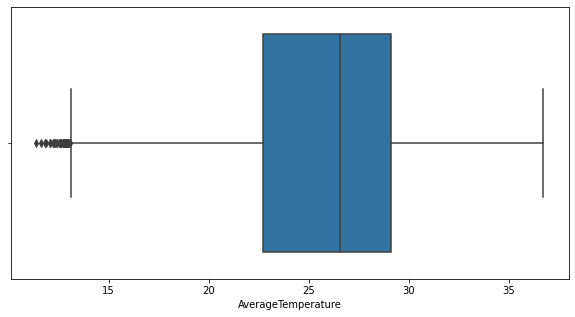

In [19]:
plt.figure(figsize = (10,5))
sns.boxplot(x = 'AverageTemperature', data = df)
plt.show()

In [20]:
q1 = df['AverageTemperature'].quantile(.25)
q3 = df['AverageTemperature'].quantile(.75)

In [21]:
def outliers(df, feature):
    Q1= df[feature].quantile(0.25)
    Q3 = df[feature].quantile(0.75)
    IQR = Q3 - Q1
    upper_limit = Q3 + 1.5 * IQR
    lower_limit = Q1 - 1.5 * IQR
    return upper_limit, lower_limit
upper, lower = outliers(df, "AverageTemperature")
print("Upper whisker: ", upper)
print("Lower Whisker: ", lower)

Upper whisker:  38.75399999999999
Lower Whisker:  13.066000000000006


In [22]:
df[(df['AverageTemperature'] < lower) | (df['AverageTemperature'] > upper)]

,dt,AverageTemperature,City
102524,1813-01-01,11.866,Agra
102596,1819-01-01,12.204,Agra
102608,1820-01-01,12.589,Agra
102824,1838-01-01,12.067,Agra
103304,1878-01-01,13.060,Agra
103424,1888-01-01,12.842,Agra
103556,1899-01-01,12.591,Agra
103580,1901-01-01,12.892,Agra
103628,1905-01-01,12.995,Agra
103629,1905-02-01,12.868,Agra


In [23]:
new_df = df[(df['AverageTemperature'] > lower) & (df['AverageTemperature'] < upper)]

In [24]:
new_df

,dt,AverageTemperature,City
102320,1796-01-01,14.855000,Agra
102321,1796-02-01,17.813000,Agra
102322,1796-03-01,22.309000,Agra
102323,1796-04-01,29.559000,Agra
102324,1796-05-01,34.471000,Agra
...,...,...,...
4500696,2013-05-01,34.587000,Madras
4500697,2013-06-01,32.996000,Madras
4500698,2013-07-01,30.770000,Madras
4500699,2013-08-01,30.513000,Madras


<AxesSubplot:xlabel='dt', ylabel='AverageTemperature'>

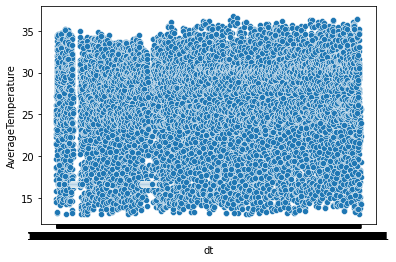

In [25]:
sns.scatterplot(data=new_df, x="dt", y="AverageTemperature")


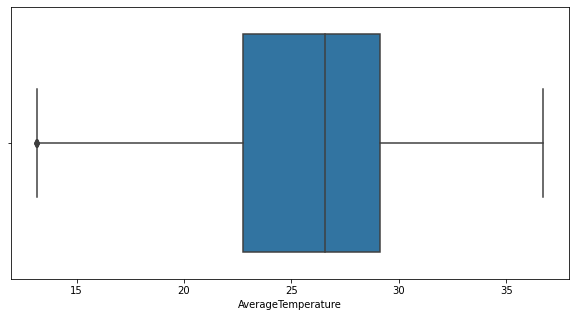

In [26]:
plt.figure(figsize = (10,5))
sns.boxplot(x = 'AverageTemperature', data = new_df)
plt.show()

In [27]:
new_df.duplicated().sum()


0

In [28]:
new_df['dt']= pd.to_datetime(new_df['dt'])
new_df.set_index('dt', inplace=True)
new_df.index

DatetimeIndex(['1796-01-01', '1796-02-01', '1796-03-01', '1796-04-01',
               '1796-05-01', '1796-06-01', '1796-07-01', '1796-08-01',
               '1796-09-01', '1796-10-01',
               ...
               '2012-12-01', '2013-01-01', '2013-02-01', '2013-03-01',
               '2013-04-01', '2013-05-01', '2013-06-01', '2013-07-01',
               '2013-08-01', '2013-09-01'],
              dtype='datetime64[ns]', name='dt', length=20863, freq=None)

In [29]:
new_df=new_df.loc['1980':'2013']


In [30]:
new_df


,AverageTemperature,City
dt,,
1980-01-01,15.335000,Agra
1980-02-01,19.549000,Agra
1980-03-01,23.958000,Agra
1980-04-01,31.741000,Agra
1980-05-01,36.270000,Agra
...,...,...
2013-05-01,34.587000,Madras
2013-06-01,32.996000,Madras
2013-07-01,30.770000,Madras


# **BANGALORE**

In [31]:
Bangalore_df=new_df[new_df['City']=='Bangalore']


In [32]:
Bangalore_df


,AverageTemperature,City
dt,,
1980-01-01,22.986000,Bangalore
1980-02-01,25.155000,Bangalore
1980-03-01,27.405000,Bangalore
1980-04-01,28.539000,Bangalore
1980-05-01,28.605000,Bangalore
...,...,...
2013-05-01,29.189000,Bangalore
2013-06-01,25.835000,Bangalore
2013-07-01,25.008000,Bangalore


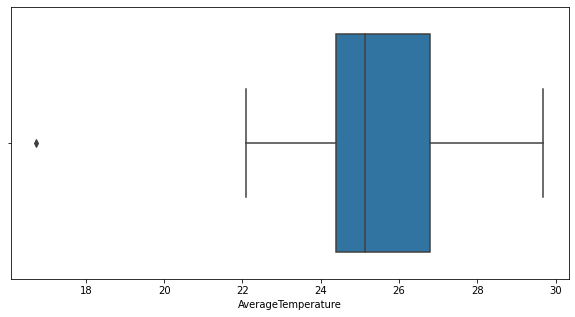

In [33]:
plt.figure(figsize = (10,5))
sns.boxplot(x = 'AverageTemperature', data = Bangalore_df)
plt.show()

In [34]:
q1 = Bangalore_df['AverageTemperature'].quantile(.25)
q3 = Bangalore_df['AverageTemperature'].quantile(.75)

In [35]:
def outliers(Bangalore_df, feature):
    Q1= Bangalore_df[feature].quantile(0.25)
    Q3 = Bangalore_df[feature].quantile(0.75)
    IQR = Q3 - Q1
    upper_limit = Q3 + 1.5 * IQR
    lower_limit = Q1 - 1.5 * IQR
    return upper_limit, lower_limit
upper, lower = outliers(Bangalore_df, "AverageTemperature")
print("Upper whisker: ", upper)
print("Lower Whisker: ", lower)

Upper whisker:  30.400500000000022
Lower Whisker:  20.764499999999984


In [36]:
Bangalore_df[(Bangalore_df['AverageTemperature'] < lower) | (Bangalore_df['AverageTemperature'] > upper)]


,AverageTemperature,City
dt,,
2013-09-01,16.727433,Bangalore


In [37]:
Bangalore_new_df = Bangalore_df[(Bangalore_df['AverageTemperature'] > lower) & (Bangalore_df['AverageTemperature'] < upper)]


In [38]:
Bangalore_new_df


,AverageTemperature,City
dt,,
1980-01-01,22.986,Bangalore
1980-02-01,25.155,Bangalore
1980-03-01,27.405,Bangalore
1980-04-01,28.539,Bangalore
1980-05-01,28.605,Bangalore
...,...,...
2013-04-01,29.593,Bangalore
2013-05-01,29.189,Bangalore
2013-06-01,25.835,Bangalore


In [39]:
drop_list=['City']
Bangalore_new_df.drop(drop_list,axis=1,inplace=True)


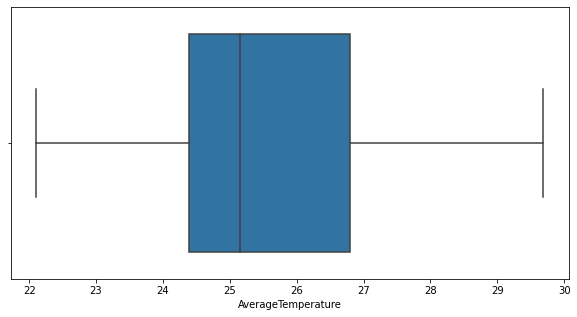

In [40]:
plt.figure(figsize = (10,5))
sns.boxplot(x = 'AverageTemperature', data = Bangalore_new_df)
plt.show()

In [41]:
Bangalore_new_df


,AverageTemperature
dt,
1980-01-01,22.986
1980-02-01,25.155
1980-03-01,27.405
1980-04-01,28.539
1980-05-01,28.605
...,...
2013-04-01,29.593
2013-05-01,29.189
2013-06-01,25.835


<AxesSubplot:xlabel='dt', ylabel='AverageTemperature'>

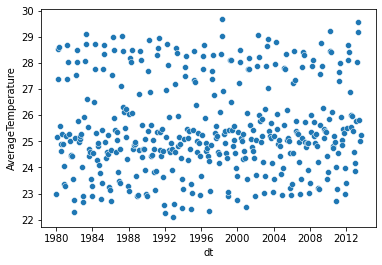

In [42]:
sns.scatterplot(data=Bangalore_new_df, x="dt", y="AverageTemperature")


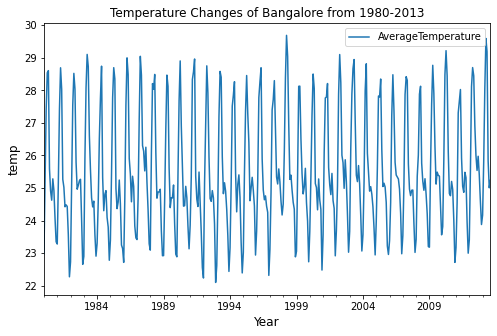

In [43]:
Bangalore_new_df.plot(title='Temperature Changes of Bangalore from 1980-2013',figsize=(8,5))
plt.ylabel('temp',fontsize=12)
plt.xlabel('Year',fontsize=12)
plt.legend()

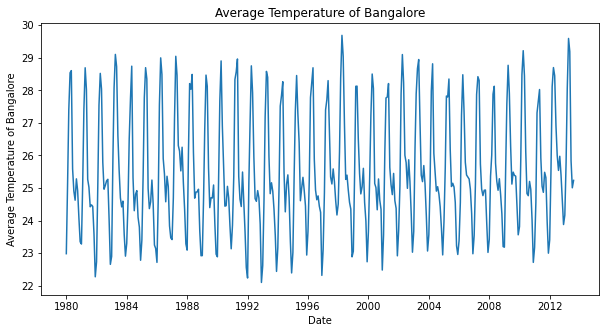

In [44]:
plt.figure(figsize=(10,5))
plt.plot(Bangalore_new_df.index,Bangalore_new_df.AverageTemperature)
plt.title("Average Temperature of Bangalore")
plt.xlabel("Date")
plt.ylabel("Average Temperature of Bangalore")
plt.show()

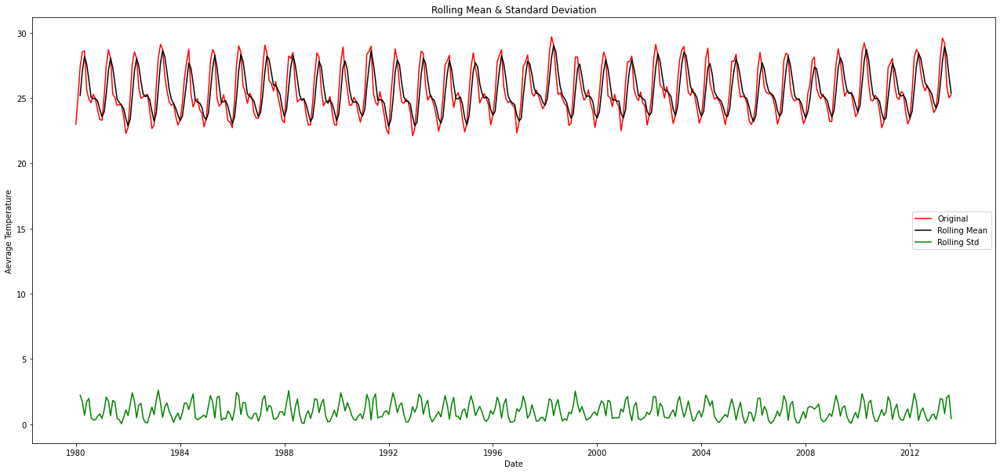

Test statistic:  -5.667701526219515
p-value:  9.07137347287474e-07
Critical Values: {'1%': -3.4473167281607155, '5%': -2.869018036958473, '10%': -2.5707536074503134}


In [45]:
# adfuller library 

# check_adfuller
def check_adfuller(ts):
    # Dickey-Fuller test
    result = adfuller(ts, autolag='AIC')
    print('Test statistic: ' , result[0])
    print('p-value: '  ,result[1])
    print('Critical Values:' ,result[4])
# check_mean_std
def check_mean_std(ts):
    #Rolling statistics
    rolmean = Bangalore_new_df.rolling( window=3).mean()
    rolstd = Bangalore_new_df.rolling( window=3).std()
    plt.figure(figsize=(22,10))   
    orig = plt.plot(ts, color='red',label='Original')
    mean = plt.plot(rolmean, color='black', label='Rolling Mean')
    std = plt.plot(rolstd, color='green', label = 'Rolling Std')
    plt.xlabel("Date")
    plt.ylabel("Aevrage Temperature")
    plt.title('Rolling Mean & Standard Deviation')
    plt.legend()
    plt.show()
    
# check stationary: mean, variance(std)and adfuller test
check_mean_std(Bangalore_new_df)
check_adfuller(Bangalore_new_df.AverageTemperature)

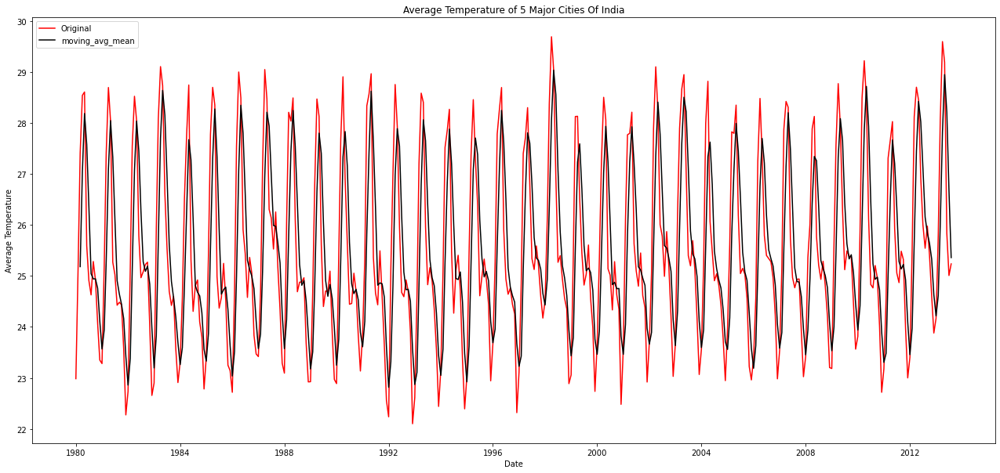

In [46]:
window_size = 3
moving_avg = Bangalore_new_df.rolling(window_size).mean()
plt.figure(figsize=(22,10))
plt.plot(Bangalore_new_df, color = "red",label = "Original")
plt.plot(moving_avg, color='black', label = "moving_avg_mean")
plt.title("Average Temperature of 5 Major Cities Of India")
plt.xlabel("Date")
plt.ylabel("Average Temperature")
plt.legend()
plt.show()

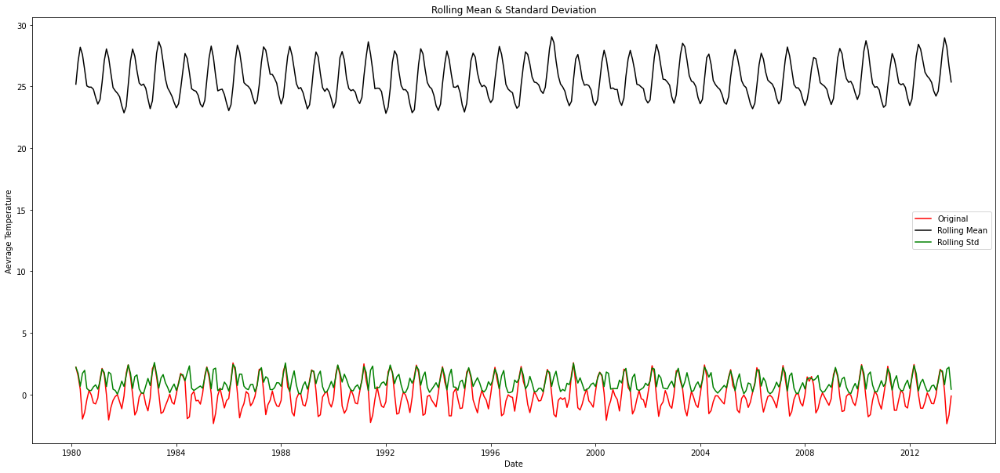

Test statistic:  -6.044222775718944
p-value:  1.323661590638567e-07
Critical Values: {'1%': -3.447405233596701, '5%': -2.8690569369014605, '10%': -2.5707743450830893}


In [47]:
rs_moving_avg_diff = Bangalore_new_df - moving_avg
rs_moving_avg_diff.dropna(inplace=True) # first 6 is nan value due to window size

# check stationary: mean, variance(std)and adfuller test
check_mean_std(rs_moving_avg_diff)
check_adfuller(rs_moving_avg_diff.AverageTemperature)

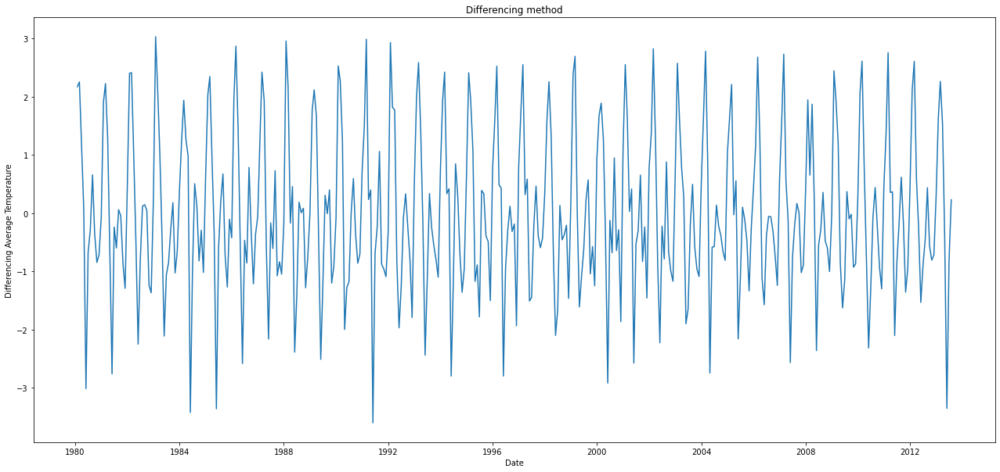

In [48]:
# differencing method
rs_diff = Bangalore_new_df - Bangalore_new_df.shift()
plt.figure(figsize=(22,10))
plt.plot(rs_diff)
plt.title("Differencing method") 
plt.xlabel("Date")
plt.ylabel("Differencing Average Temperature")
plt.show()

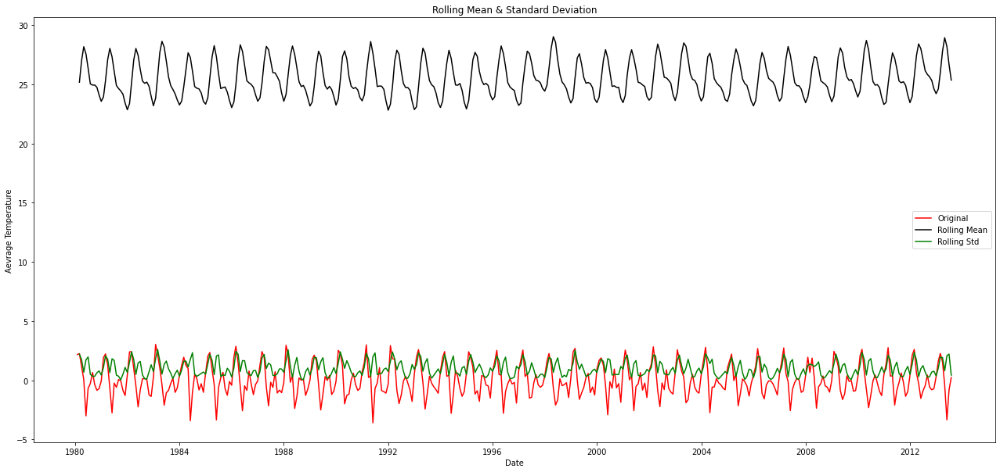

Test statistic:  -6.076778350983557
p-value:  1.1166808029848781e-07
Critical Values: {'1%': -3.447405233596701, '5%': -2.8690569369014605, '10%': -2.5707743450830893}


In [49]:
rs_diff.dropna(inplace=True) # due to shifting there is nan values
# check stationary: mean, variance(std)and adfuller test
check_mean_std(rs_diff)
check_adfuller(rs_diff.AverageTemperature)

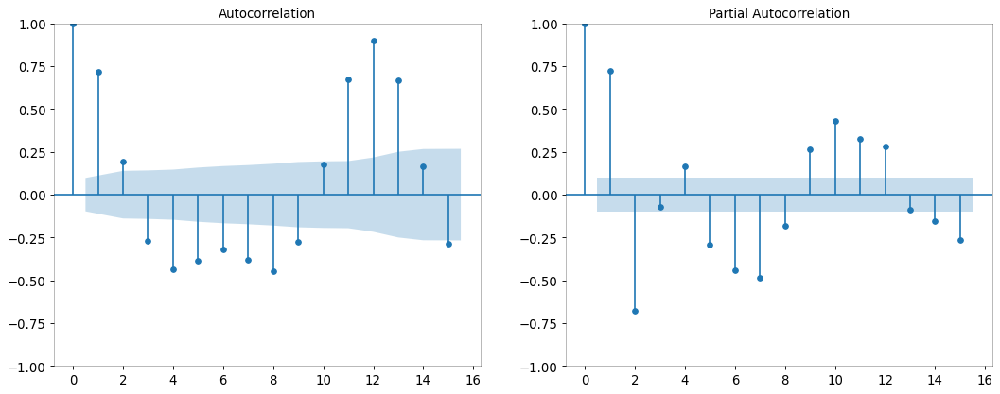

In [50]:
# ACF and PACF for resample data

ig, (ax1, ax2) = plt.subplots(1, 2,figsize=(16,6), dpi= 80)
plot_acf(Bangalore_new_df.AverageTemperature, ax=ax1, lags=15)
plot_pacf(Bangalore_new_df.AverageTemperature, ax=ax2, lags=15)


ax1.spines["top"].set_alpha(.3); ax2.spines["top"].set_alpha(.3)
ax1.spines["bottom"].set_alpha(.3); ax2.spines["bottom"].set_alpha(.3)
ax1.spines["right"].set_alpha(.3); ax2.spines["right"].set_alpha(.3)
ax1.spines["left"].set_alpha(.3); ax2.spines["left"].set_alpha(.3)

ax1.tick_params(axis='both', labelsize=12)
ax2.tick_params(axis='both', labelsize=12)
plt.show()

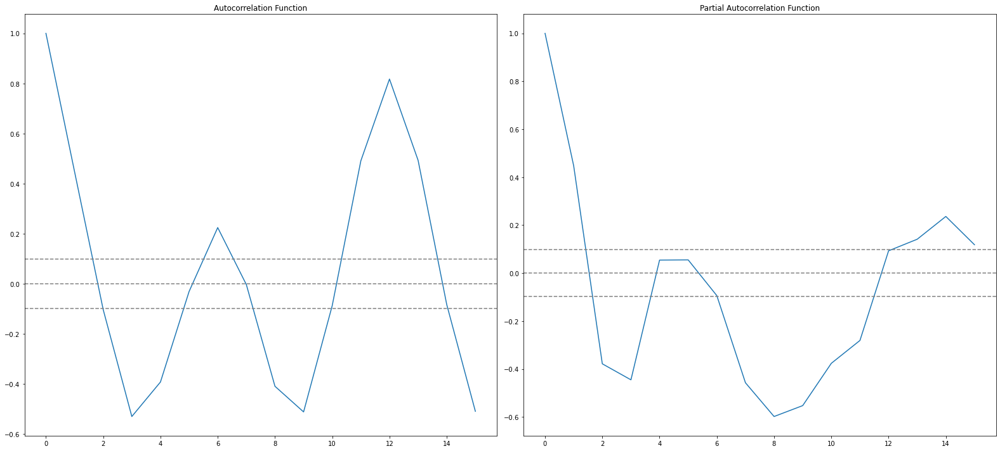

In [51]:
# ACF and PACF for resample data

lag_acf = acf(rs_diff, nlags=15)
lag_pacf = pacf(rs_diff, nlags=15, method='ols')
# ACF
plt.figure(figsize=(22,10))

plt.subplot(121) 
plt.plot(lag_acf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(rs_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(rs_diff)),linestyle='--',color='gray')
plt.title('Autocorrelation Function')

# PACF
plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(rs_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(rs_diff)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')
plt.tight_layout()

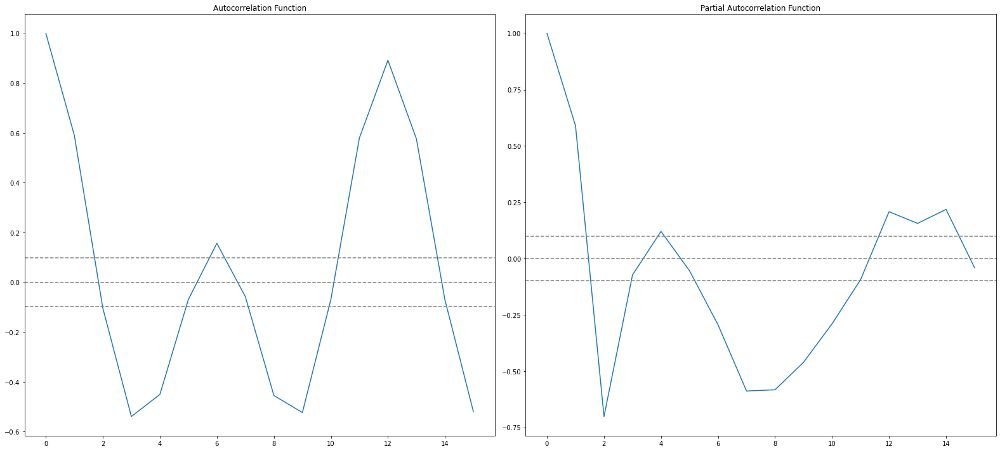

In [52]:
#ACF and PACF for moving AVG diff

lag_acf = acf(rs_moving_avg_diff, nlags=15)
lag_pacf = pacf(rs_moving_avg_diff, nlags=15, method='ols')
# ACF
plt.figure(figsize=(22,10))

plt.subplot(121) 
plt.plot(lag_acf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(rs_moving_avg_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(rs_moving_avg_diff)),linestyle='--',color='gray')
plt.title('Autocorrelation Function')

# PACF
plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(rs_moving_avg_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(rs_moving_avg_diff)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')
plt.tight_layout()

In [53]:
Bangalore_new_df.index

DatetimeIndex(['1980-01-01', '1980-02-01', '1980-03-01', '1980-04-01',
               '1980-05-01', '1980-06-01', '1980-07-01', '1980-08-01',
               '1980-09-01', '1980-10-01',
               ...
               '2012-11-01', '2012-12-01', '2013-01-01', '2013-02-01',
               '2013-03-01', '2013-04-01', '2013-05-01', '2013-06-01',
               '2013-07-01', '2013-08-01'],
              dtype='datetime64[ns]', name='dt', length=404, freq=None)

0.8755788400202065


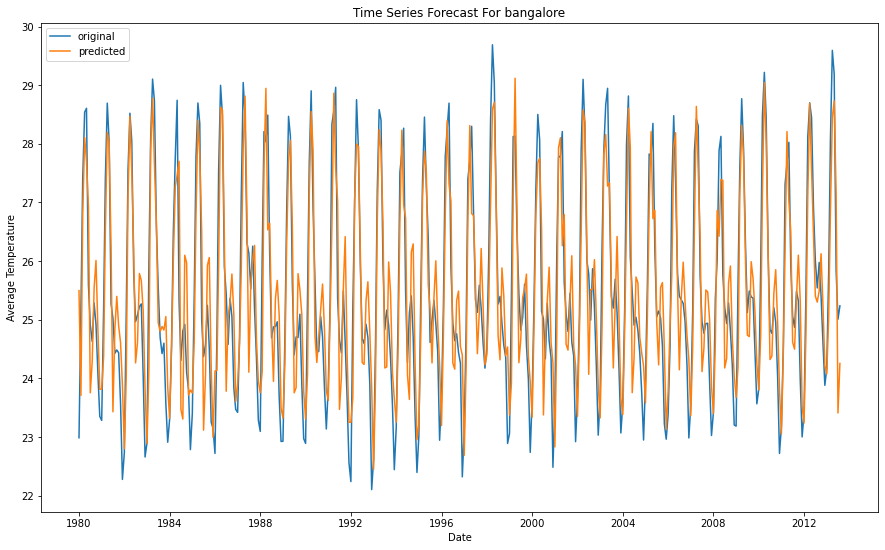

In [54]:

# fit model
model = sm.tsa.arima.ARIMA(Bangalore_new_df.AverageTemperature, order=(2,0,2)) # (ARIMA) = (1,0,1)
model_fit = model.fit()

# predict
start_index = datetime(1980, 1, 1)
end_index = datetime(2013, 8, 1)
forecast = model_fit.predict(start=start_index, end=end_index)
RMSE= np.sqrt(metrics.mean_squared_error(Bangalore_new_df, forecast))

print(RMSE)


# visualization
plt.figure(figsize=(15,9))
plt.plot(Bangalore_new_df.index,Bangalore_new_df.AverageTemperature,label = "original")
plt.plot(forecast,label = "predicted")
plt.title("Time Series Forecast For bangalore")
plt.xlabel("Date")
plt.ylabel("Average Temperature")


plt.legend()
plt.show()

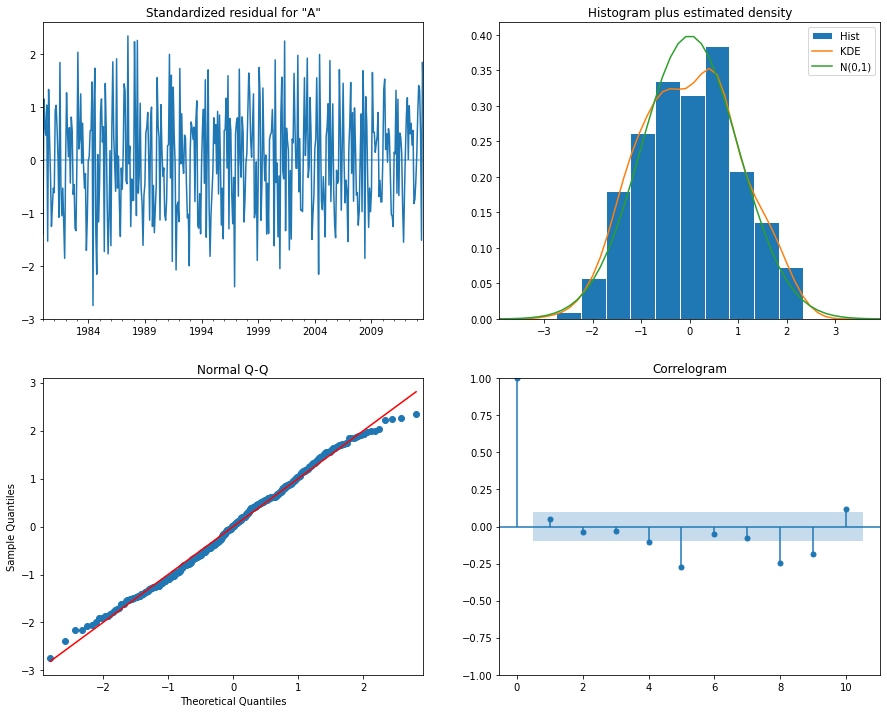

In [55]:
model_fit.plot_diagnostics(figsize=(15, 12))
plt.show()

In [56]:
pred_uc = model_fit.get_forecast(steps=120)
pred_ci = pred_uc.conf_int()

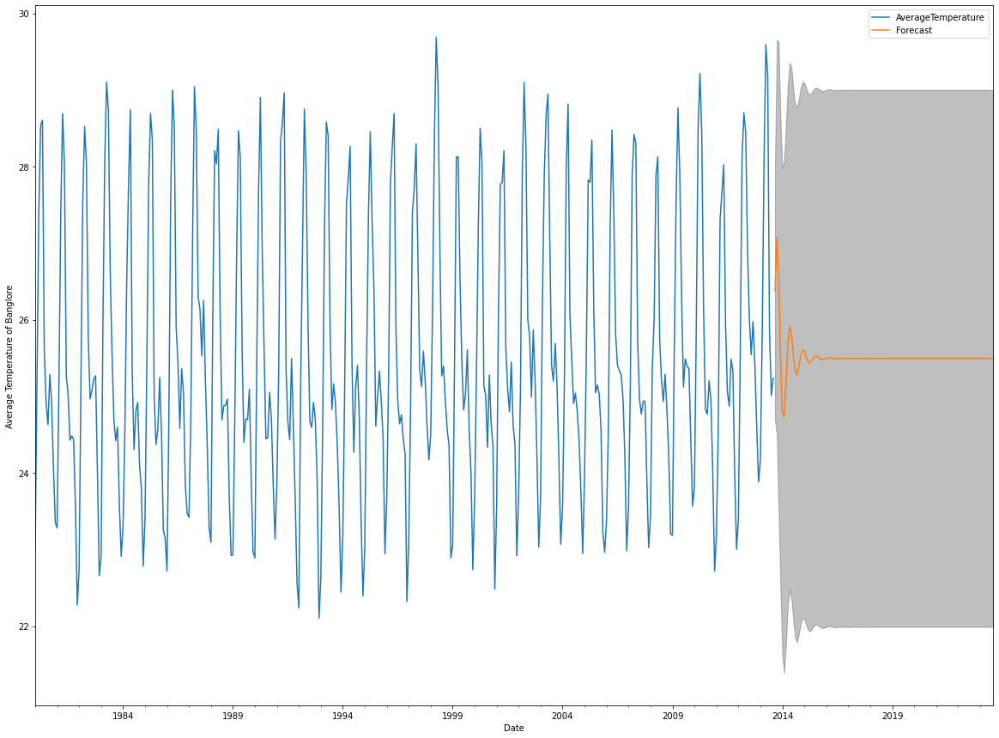

In [57]:
ax = Bangalore_new_df.plot(label='observed', figsize=(20, 15))
pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Average Temperature of Banglore')

plt.legend()
plt.show()

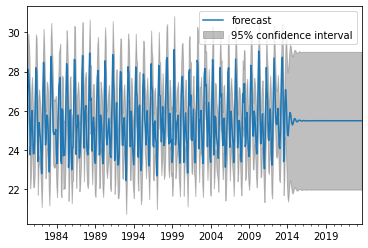

In [58]:
from statsmodels.graphics.tsaplots import plot_predict
plot_predict(model_fit,1,524,)
plt.show()

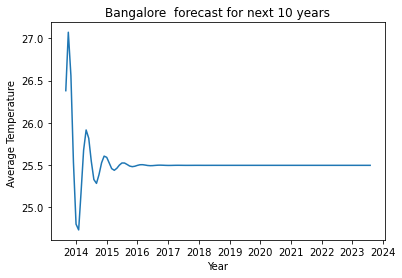

In [59]:
x1= model_fit.forecast(steps=120)
plt.xlabel('Year')
plt.ylabel('Average Temperature ')
plt.title('Bangalore  forecast for next 10 years')
plt.plot(x1)

# **MADRAS**

In [60]:
Madras_df=new_df[new_df['City']=='Madras']

In [61]:
Madras_df


,AverageTemperature,City
dt,,
1980-01-01,25.147000,Madras
1980-02-01,26.481000,Madras
1980-03-01,28.742000,Madras
1980-04-01,31.186000,Madras
1980-05-01,33.832000,Madras
...,...,...
2013-05-01,34.587000,Madras
2013-06-01,32.996000,Madras
2013-07-01,30.770000,Madras


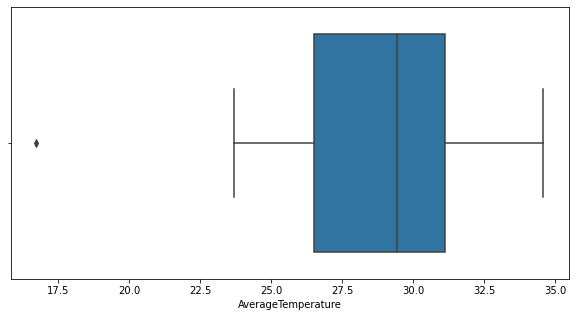

In [62]:
plt.figure(figsize = (10,5))
sns.boxplot(x = 'AverageTemperature', data = Madras_df)
plt.show()

In [63]:
q1 = Madras_df['AverageTemperature'].quantile(.25)
q3 = Madras_df['AverageTemperature'].quantile(.75)

In [64]:
def outliers(Madras_df, feature):
    Q1= Madras_df[feature].quantile(0.25)
    Q3 = Madras_df[feature].quantile(0.75)
    IQR = Q3 - Q1
    upper_limit = Q3 + 1.5 * IQR
    lower_limit = Q1 - 1.5 * IQR
    return upper_limit, lower_limit
upper, lower = outliers(Madras_df, "AverageTemperature")
print("Upper whisker: ", upper)
print("Lower Whisker: ", lower)

Upper whisker:  38.06600000000002
Lower Whisker:  19.585999999999984


In [65]:
Madras_df[(Madras_df['AverageTemperature'] < lower) | (Madras_df['AverageTemperature'] > upper)]

,AverageTemperature,City
dt,,
2013-09-01,16.727433,Madras


In [66]:
Madras_new_df = Madras_df[(Madras_df['AverageTemperature'] > lower) & (Madras_df['AverageTemperature'] < upper)]

In [67]:
Madras_new_df


,AverageTemperature,City
dt,,
1980-01-01,25.147,Madras
1980-02-01,26.481,Madras
1980-03-01,28.742,Madras
1980-04-01,31.186,Madras
1980-05-01,33.832,Madras
...,...,...
2013-04-01,32.124,Madras
2013-05-01,34.587,Madras
2013-06-01,32.996,Madras


In [68]:
drop_list=['City']
Madras_new_df.drop(drop_list,axis=1,inplace=True)


In [69]:
Madras_new_df


,AverageTemperature
dt,
1980-01-01,25.147
1980-02-01,26.481
1980-03-01,28.742
1980-04-01,31.186
1980-05-01,33.832
...,...
2013-04-01,32.124
2013-05-01,34.587
2013-06-01,32.996


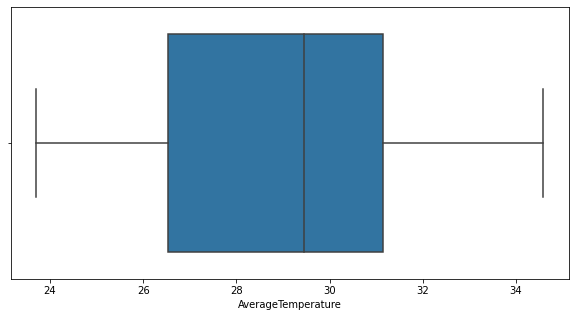

In [70]:
plt.figure(figsize = (10,5))
sns.boxplot(x = 'AverageTemperature', data = Madras_new_df)
plt.show()

In [71]:
Madras_new_df


,AverageTemperature
dt,
1980-01-01,25.147
1980-02-01,26.481
1980-03-01,28.742
1980-04-01,31.186
1980-05-01,33.832
...,...
2013-04-01,32.124
2013-05-01,34.587
2013-06-01,32.996


<AxesSubplot:xlabel='dt', ylabel='AverageTemperature'>

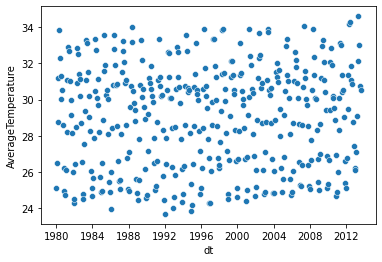

In [72]:
sns.scatterplot(data=Madras_new_df, x="dt", y="AverageTemperature")

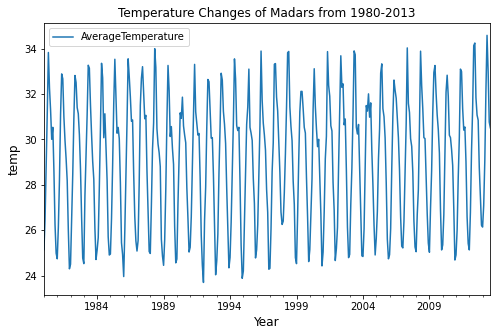

In [73]:
Madras_new_df.plot(title='Temperature Changes of Madars from 1980-2013',figsize=(8,5))
plt.ylabel('temp',fontsize=12)
plt.xlabel('Year',fontsize=12)
plt.legend()

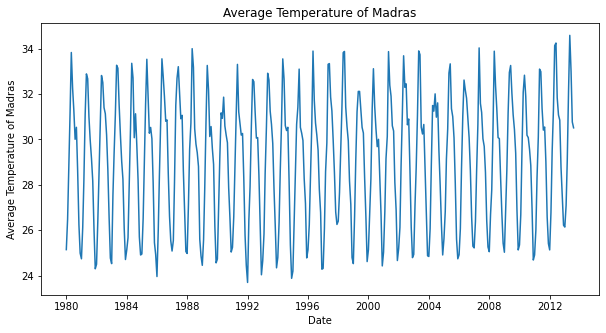

In [74]:
plt.figure(figsize=(10,5))
plt.plot(Madras_new_df.index,Madras_new_df.AverageTemperature)
plt.title("Average Temperature of Madras")
plt.xlabel("Date")
plt.ylabel("Average Temperature of Madras")
plt.show()

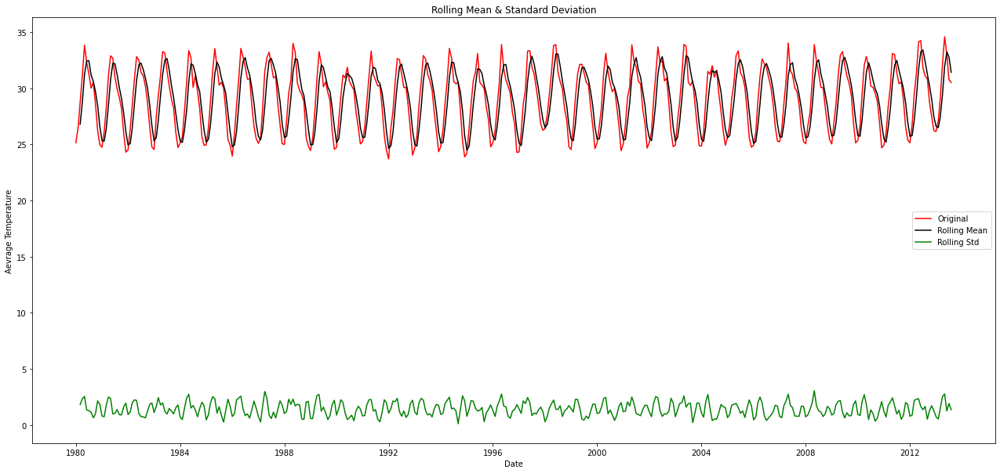

Test statistic:  -4.637713407602387
p-value:  0.00011000045879441844
Critical Values: {'1%': -3.447360865754795, '5%': -2.8690374364690445, '10%': -2.5707639493486636}


In [75]:
# adfuller library 

# check_adfuller
def check_adfuller(ts):
    # Dickey-Fuller test
    result = adfuller(ts, autolag='AIC')
    print('Test statistic: ' , result[0])
    print('p-value: '  ,result[1])
    print('Critical Values:' ,result[4])
# check_mean_std
def check_mean_std(ts):
    #Rolling statistics
    rolmean = Madras_new_df.rolling( window=3).mean()
    rolstd = Madras_new_df.rolling( window=3).std()
    plt.figure(figsize=(22,10))   
    orig = plt.plot(ts, color='red',label='Original')
    mean = plt.plot(rolmean, color='black', label='Rolling Mean')
    std = plt.plot(rolstd, color='green', label = 'Rolling Std')
    plt.xlabel("Date")
    plt.ylabel("Aevrage Temperature")
    plt.title('Rolling Mean & Standard Deviation')
    plt.legend()
    plt.show()
    
# check stationary: mean, variance(std)and adfuller test
check_mean_std(Madras_new_df)
check_adfuller(Madras_new_df.AverageTemperature)

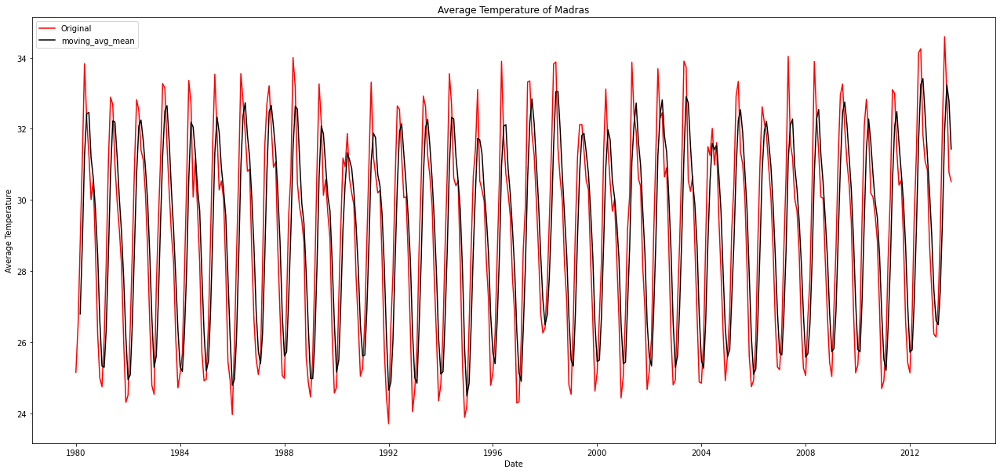

In [76]:
window_size = 3
moving_avg = Madras_new_df.rolling(window_size).mean()
plt.figure(figsize=(22,10))
plt.plot(Madras_new_df, color = "red",label = "Original")
plt.plot(moving_avg, color='black', label = "moving_avg_mean")
plt.title("Average Temperature of Madras")
plt.xlabel("Date")
plt.ylabel("Average Temperature")
plt.legend()
plt.show()

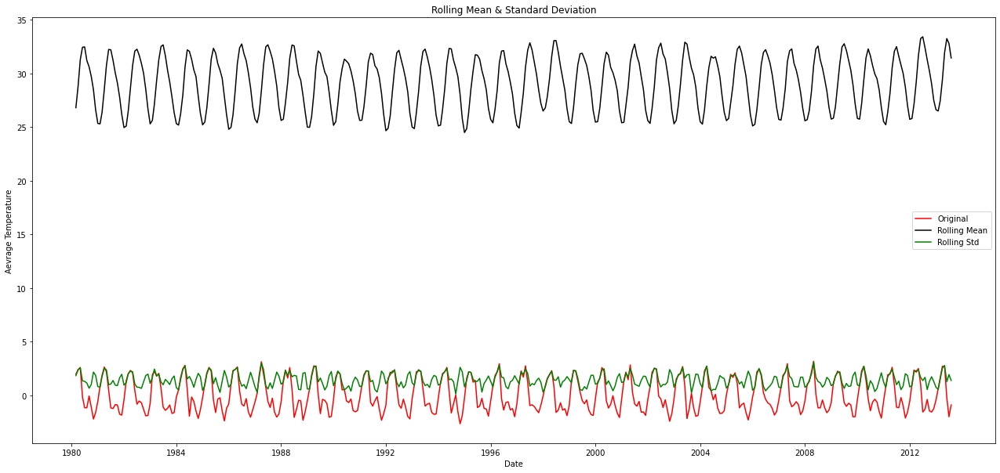

Test statistic:  -7.171347441881042
p-value:  2.7992347183102746e-10
Critical Values: {'1%': -3.4473167281607155, '5%': -2.869018036958473, '10%': -2.5707536074503134}


In [77]:
rs_moving_avg_diff = Madras_new_df - moving_avg
rs_moving_avg_diff.dropna(inplace=True) # first 6 is nan value due to window size

# check stationary: mean, variance(std)and adfuller test
check_mean_std(rs_moving_avg_diff)
check_adfuller(rs_moving_avg_diff.AverageTemperature)

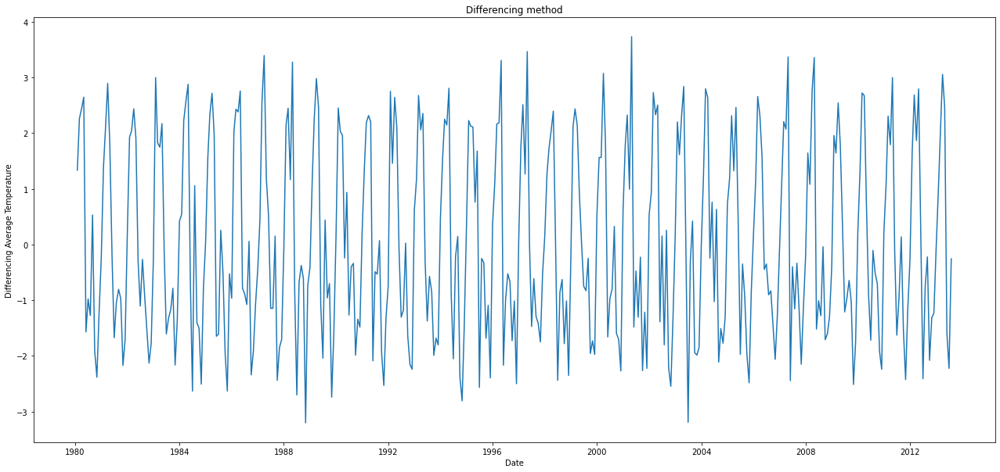

In [78]:
# differencing method
rs_diff = Madras_new_df - Madras_new_df.shift()
plt.figure(figsize=(22,10))
plt.plot(rs_diff)
plt.title("Differencing method") 
plt.xlabel("Date")
plt.ylabel("Differencing Average Temperature")
plt.show()

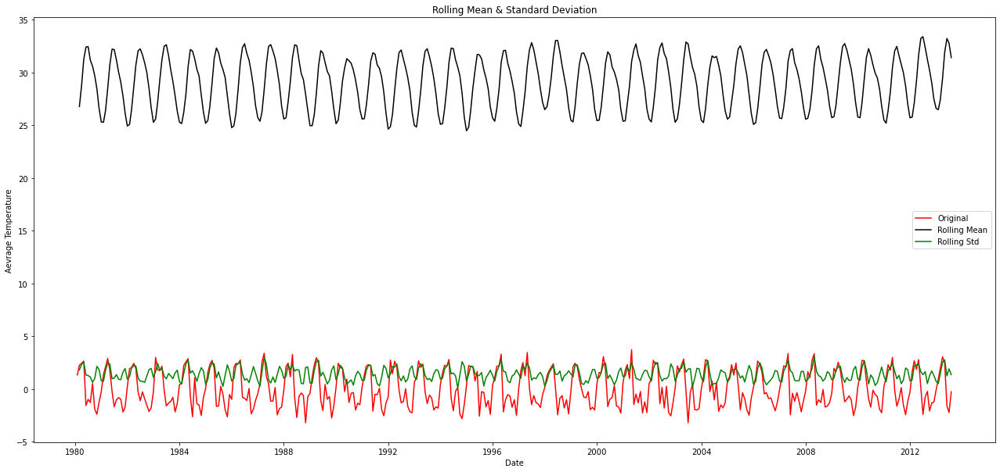

Test statistic:  -5.987289755931119
p-value:  1.7796914591358297e-07
Critical Values: {'1%': -3.447360865754795, '5%': -2.8690374364690445, '10%': -2.5707639493486636}


In [79]:
rs_diff.dropna(inplace=True) # due to shifting there is nan values
# check stationary: mean, variance(std)and adfuller test
check_mean_std(rs_diff)
check_adfuller(rs_diff.AverageTemperature)

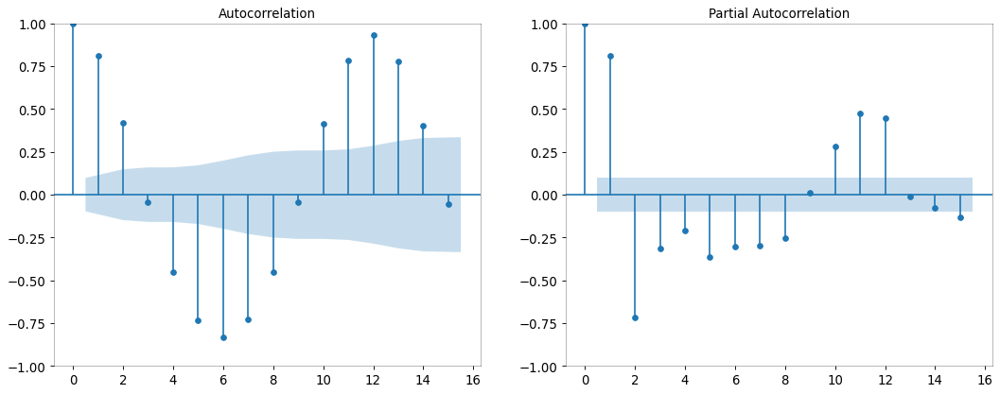

In [80]:
# ACF and PACF for resample data

ig, (ax1, ax2) = plt.subplots(1, 2,figsize=(16,6), dpi= 80)
plot_acf(Madras_new_df.AverageTemperature, ax=ax1, lags=15)
plot_pacf(Madras_new_df.AverageTemperature, ax=ax2, lags=15)


ax1.spines["top"].set_alpha(.3); ax2.spines["top"].set_alpha(.3)
ax1.spines["bottom"].set_alpha(.3); ax2.spines["bottom"].set_alpha(.3)
ax1.spines["right"].set_alpha(.3); ax2.spines["right"].set_alpha(.3)
ax1.spines["left"].set_alpha(.3); ax2.spines["left"].set_alpha(.3)

ax1.tick_params(axis='both', labelsize=12)
ax2.tick_params(axis='both', labelsize=12)
plt.show()

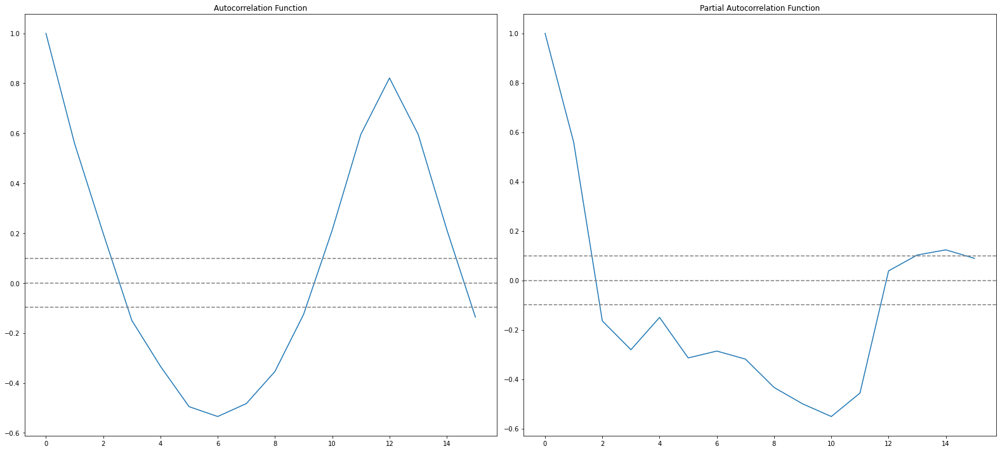

In [81]:
# ACF and PACF for resample data

lag_acf = acf(rs_diff, nlags=15)
lag_pacf = pacf(rs_diff, nlags=15, method='ols')
# ACF
plt.figure(figsize=(22,10))

plt.subplot(121) 
plt.plot(lag_acf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(rs_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(rs_diff)),linestyle='--',color='gray')
plt.title('Autocorrelation Function')

# PACF
plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(rs_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(rs_diff)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')
plt.tight_layout()

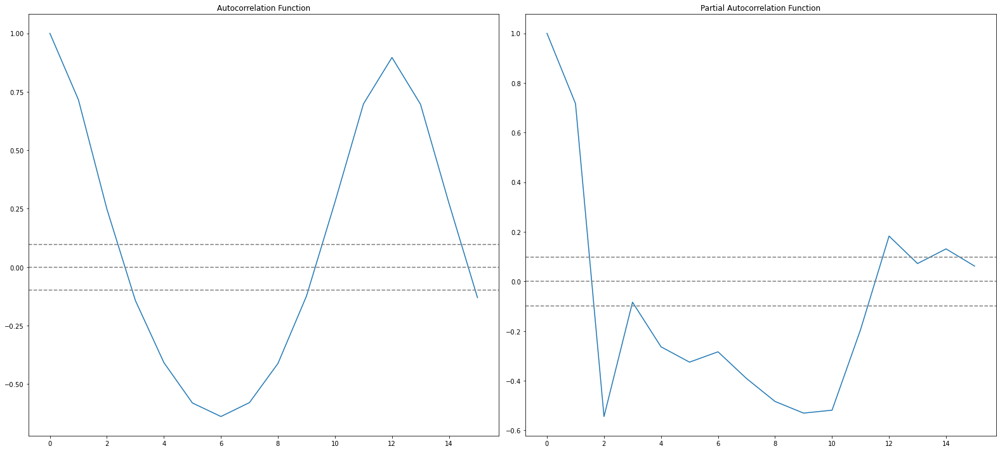

In [82]:
#ACF and PACF for moving AVG diff

lag_acf = acf(rs_moving_avg_diff, nlags=15)
lag_pacf = pacf(rs_moving_avg_diff, nlags=15, method='ols')
# ACF
plt.figure(figsize=(22,10))

plt.subplot(121) 
plt.plot(lag_acf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(rs_moving_avg_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(rs_moving_avg_diff)),linestyle='--',color='gray')
plt.title('Autocorrelation Function')

# PACF
plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(rs_moving_avg_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(rs_moving_avg_diff)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')
plt.tight_layout()

In [83]:
Madras_new_df.index


DatetimeIndex(['1980-01-01', '1980-02-01', '1980-03-01', '1980-04-01',
               '1980-05-01', '1980-06-01', '1980-07-01', '1980-08-01',
               '1980-09-01', '1980-10-01',
               ...
               '2012-11-01', '2012-12-01', '2013-01-01', '2013-02-01',
               '2013-03-01', '2013-04-01', '2013-05-01', '2013-06-01',
               '2013-07-01', '2013-08-01'],
              dtype='datetime64[ns]', name='dt', length=404, freq=None)

0.973869934933867


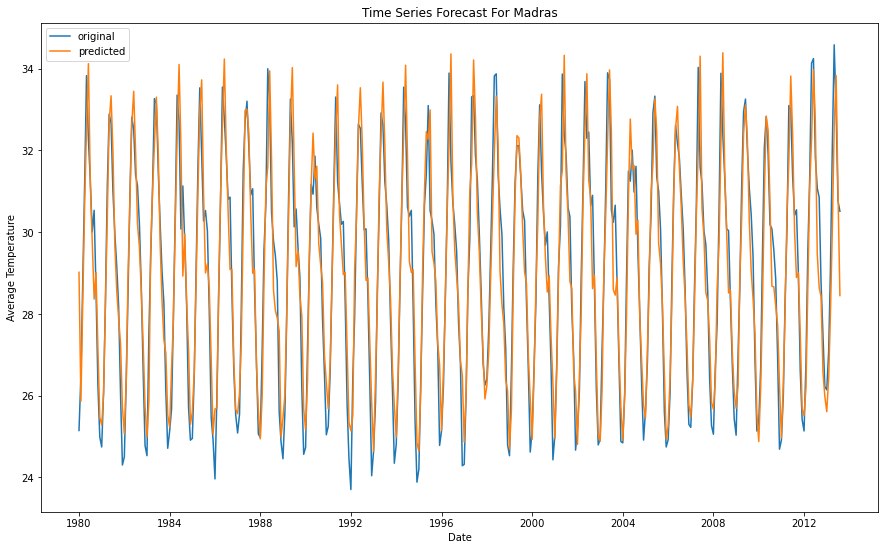

In [84]:

# fit model
model = sm.tsa.arima.ARIMA(Madras_new_df.AverageTemperature, order=(3,0,2)) # (ARIMA) = (1,0,1)
model_fit = model.fit()

# predict
start_index = datetime(1980, 1, 1)
end_index = datetime(2013, 8, 1)
forecast = model_fit.predict(start=start_index, end=end_index)
RMSE= np.sqrt(metrics.mean_squared_error(Madras_new_df, forecast))

print(RMSE)


# visualization
plt.figure(figsize=(15,9))
plt.plot(Madras_new_df.index,Madras_new_df.AverageTemperature,label = "original")
plt.plot(forecast,label = "predicted")
plt.title("Time Series Forecast For Madras")
plt.xlabel("Date")
plt.ylabel("Average Temperature")


plt.legend()
plt.show()

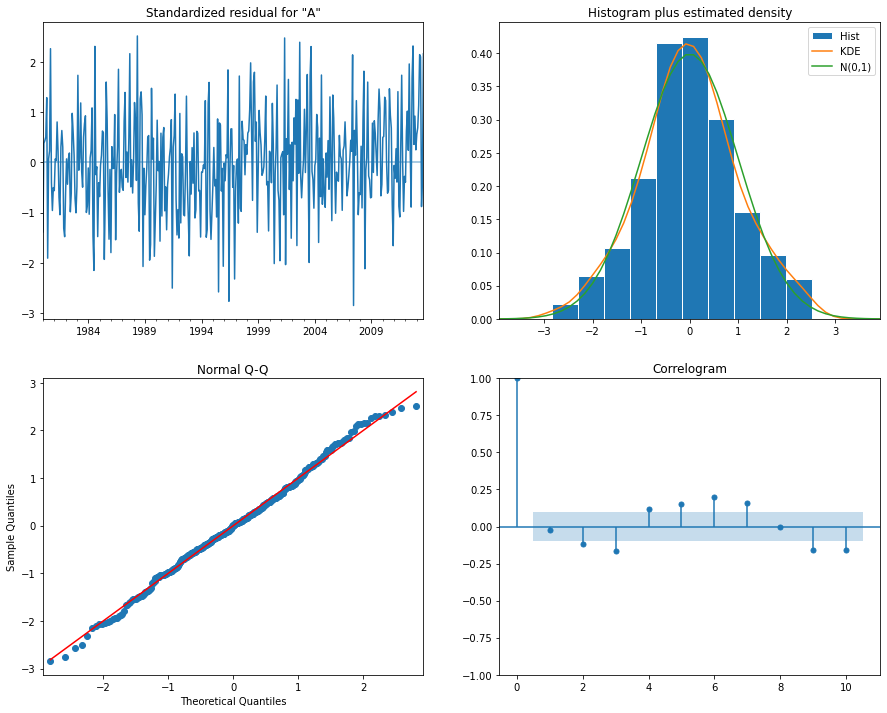

In [85]:
model_fit.plot_diagnostics(figsize=(15, 12))
plt.show()

In [86]:
pred_uc = model_fit.get_forecast(steps=120)
pred_ci = pred_uc.conf_int()

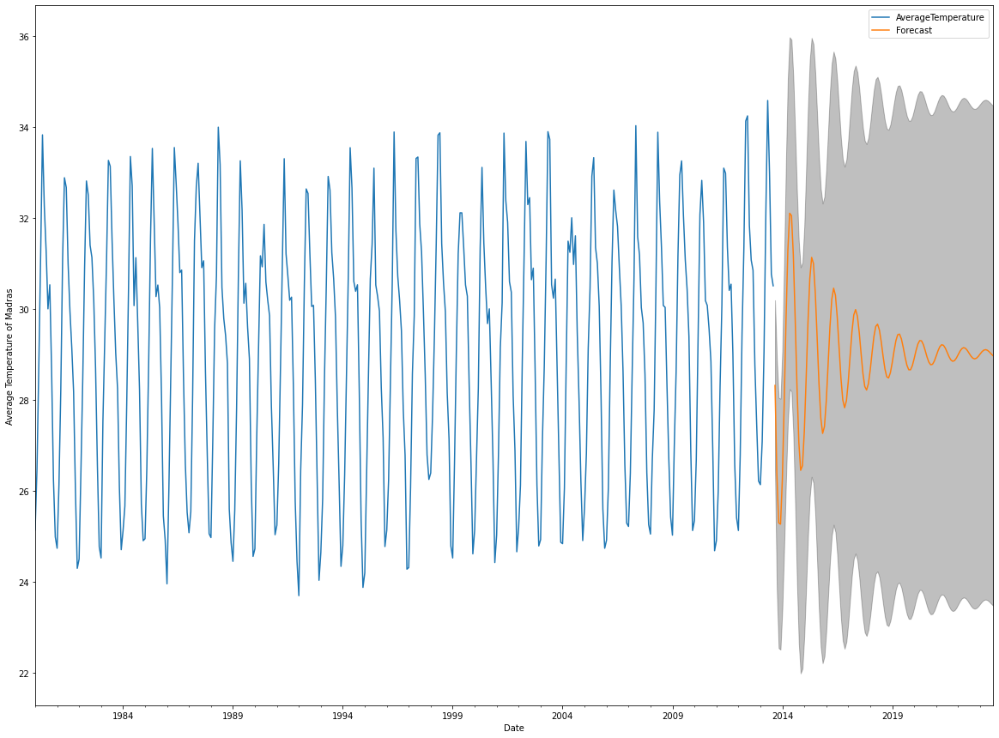

In [87]:
ax = Madras_new_df.plot(label='observed', figsize=(20, 15))
pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Average Temperature of Madras')

plt.legend()
plt.show()

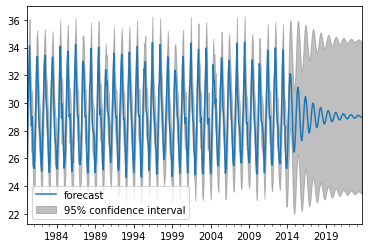

In [88]:
from statsmodels.graphics.tsaplots import plot_predict
plot_predict(model_fit,1,524,)
plt.show()

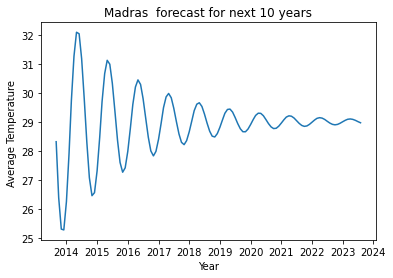

In [89]:
x2= model_fit.forecast(steps=120)
plt.xlabel('Year')
plt.ylabel('Average Temperature ')
plt.title('Madras  forecast for next 10 years')
plt.plot(x2)

# **CALCUTTA**

In [90]:
Calcutta_df=new_df[new_df['City']=='Calcutta']


In [91]:
Calcutta_df

,AverageTemperature,City
dt,,
1980-01-01,19.298000,Calcutta
1980-02-01,22.487000,Calcutta
1980-03-01,27.118000,Calcutta
1980-04-01,31.471000,Calcutta
1980-05-01,30.617000,Calcutta
...,...,...
2013-05-01,30.921000,Calcutta
2013-06-01,30.618000,Calcutta
2013-07-01,30.000000,Calcutta


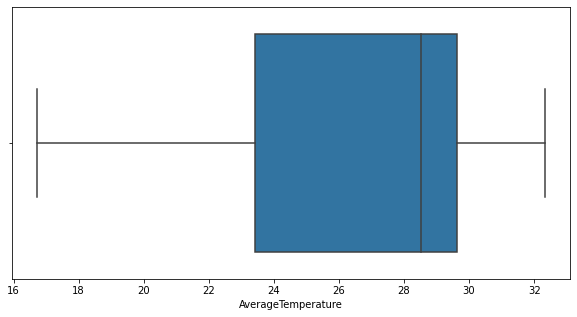

In [92]:
plt.figure(figsize = (10,5))
sns.boxplot(x = 'AverageTemperature', data = Calcutta_df)
plt.show()

In [93]:
q1 = Calcutta_df['AverageTemperature'].quantile(.25)
q3 = Calcutta_df['AverageTemperature'].quantile(.75)

In [94]:
def outliers(Calcutta_df, feature):
    Q1= Calcutta_df[feature].quantile(0.25)
    Q3 = Calcutta_df[feature].quantile(0.75)
    IQR = Q3 - Q1
    upper_limit = Q3 + 1.5 * IQR
    lower_limit = Q1 - 1.5 * IQR
    return upper_limit, lower_limit
upper, lower = outliers(Calcutta_df, "AverageTemperature")
print("Upper whisker: ", upper)
print("Lower Whisker: ", lower)

Upper whisker:  38.926
Lower Whisker:  14.125999999999994


In [95]:
Calcutta_df[(Calcutta_df['AverageTemperature'] < lower) | (Calcutta_df['AverageTemperature'] > upper)]


,AverageTemperature,City
dt,,


In [96]:
Calcutta_new_df = Calcutta_df[(Calcutta_df['AverageTemperature'] > lower) & (Calcutta_df['AverageTemperature'] < upper)]


In [97]:
Calcutta_new_df


,AverageTemperature,City
dt,,
1980-01-01,19.298000,Calcutta
1980-02-01,22.487000,Calcutta
1980-03-01,27.118000,Calcutta
1980-04-01,31.471000,Calcutta
1980-05-01,30.617000,Calcutta
...,...,...
2013-05-01,30.921000,Calcutta
2013-06-01,30.618000,Calcutta
2013-07-01,30.000000,Calcutta


In [98]:
drop_list=['City']
Calcutta_new_df.drop(drop_list,axis=1,inplace=True)


In [99]:
Calcutta_new_df


,AverageTemperature
dt,
1980-01-01,19.298000
1980-02-01,22.487000
1980-03-01,27.118000
1980-04-01,31.471000
1980-05-01,30.617000
...,...
2013-05-01,30.921000
2013-06-01,30.618000
2013-07-01,30.000000


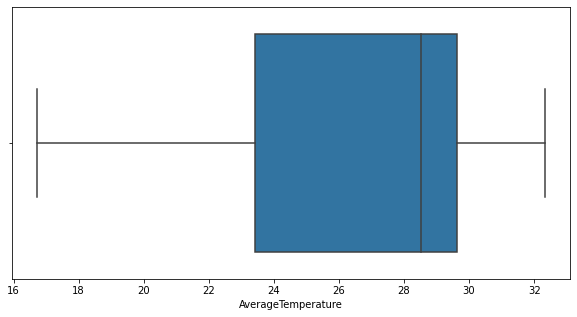

In [100]:
plt.figure(figsize = (10,5))
sns.boxplot(x = 'AverageTemperature', data = Calcutta_new_df)
plt.show()

In [101]:
Calcutta_new_df


,AverageTemperature
dt,
1980-01-01,19.298000
1980-02-01,22.487000
1980-03-01,27.118000
1980-04-01,31.471000
1980-05-01,30.617000
...,...
2013-05-01,30.921000
2013-06-01,30.618000
2013-07-01,30.000000


<AxesSubplot:xlabel='dt', ylabel='AverageTemperature'>

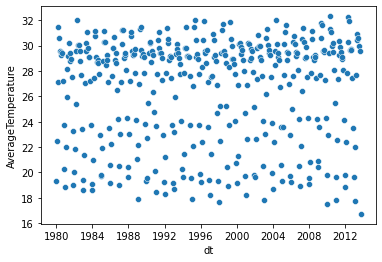

In [102]:
sns.scatterplot(data=Calcutta_new_df, x="dt", y="AverageTemperature")

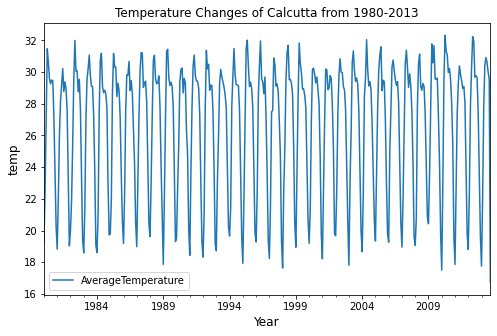

In [103]:
Calcutta_new_df.plot(title='Temperature Changes of Calcutta from 1980-2013',figsize=(8,5))
plt.ylabel('temp',fontsize=12)
plt.xlabel('Year',fontsize=12)
plt.legend()

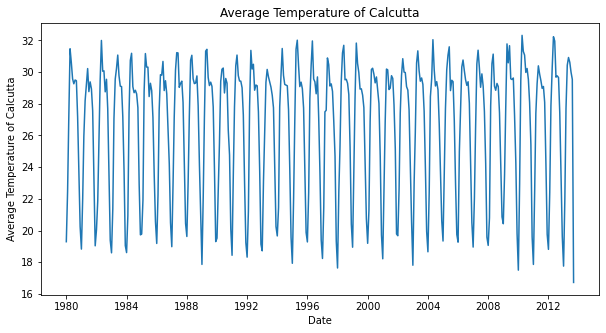

In [104]:
plt.figure(figsize=(10,5))
plt.plot(Calcutta_new_df.index,Calcutta_new_df.AverageTemperature)
plt.title("Average Temperature of Calcutta")
plt.xlabel("Date")
plt.ylabel("Average Temperature of Calcutta")
plt.show()

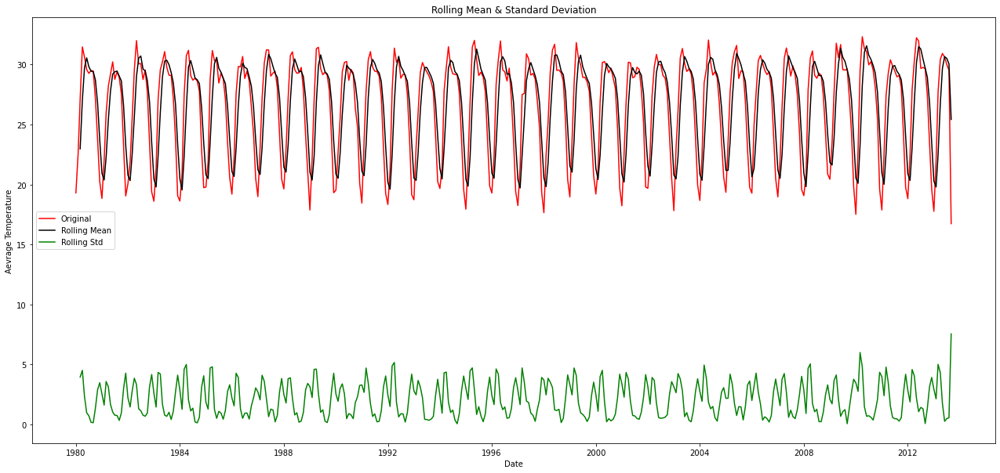

Test statistic:  -3.876191273114477
p-value:  0.002217223431685575
Critical Values: {'1%': -3.447272819026727, '5%': -2.868998737588248, '10%': -2.5707433189709294}


In [105]:
# adfuller library 

# check_adfuller
def check_adfuller(ts):
    # Dickey-Fuller test
    result = adfuller(ts, autolag='AIC')
    print('Test statistic: ' , result[0])
    print('p-value: '  ,result[1])
    print('Critical Values:' ,result[4])
# check_mean_std
def check_mean_std(ts):
    #Rolling statistics
    rolmean = Calcutta_new_df.rolling( window=3).mean()
    rolstd = Calcutta_new_df.rolling( window=3).std()
    plt.figure(figsize=(22,10))   
    orig = plt.plot(ts, color='red',label='Original')
    mean = plt.plot(rolmean, color='black', label='Rolling Mean')
    std = plt.plot(rolstd, color='green', label = 'Rolling Std')
    plt.xlabel("Date")
    plt.ylabel("Aevrage Temperature")
    plt.title('Rolling Mean & Standard Deviation')
    plt.legend()
    plt.show()
    
# check stationary: mean, variance(std)and adfuller test
check_mean_std(Calcutta_new_df)
check_adfuller(Calcutta_new_df.AverageTemperature)

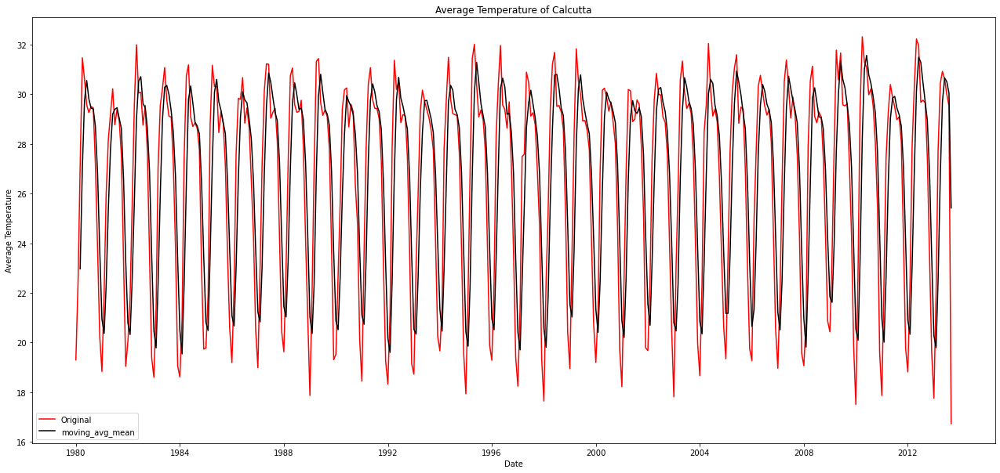

In [106]:
window_size = 3
moving_avg = Calcutta_new_df.rolling(window_size).mean()
plt.figure(figsize=(22,10))
plt.plot(Calcutta_new_df, color = "red",label = "Original")
plt.plot(moving_avg, color='black', label = "moving_avg_mean")
plt.title("Average Temperature of Calcutta")
plt.xlabel("Date")
plt.ylabel("Average Temperature")
plt.legend()
plt.show()

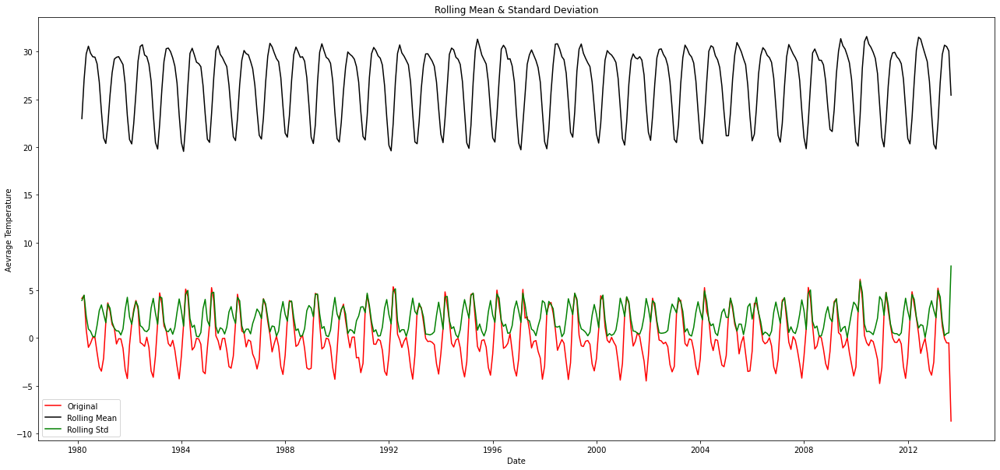

Test statistic:  -7.0717260718959905
p-value:  4.917494728500285e-10
Critical Values: {'1%': -3.4472291365835566, '5%': -2.8689795375849223, '10%': -2.5707330834976987}


In [107]:
rs_moving_avg_diff = Calcutta_new_df - moving_avg
rs_moving_avg_diff.dropna(inplace=True) # first 6 is nan value due to window size

# check stationary: mean, variance(std)and adfuller test
check_mean_std(rs_moving_avg_diff)
check_adfuller(rs_moving_avg_diff.AverageTemperature)

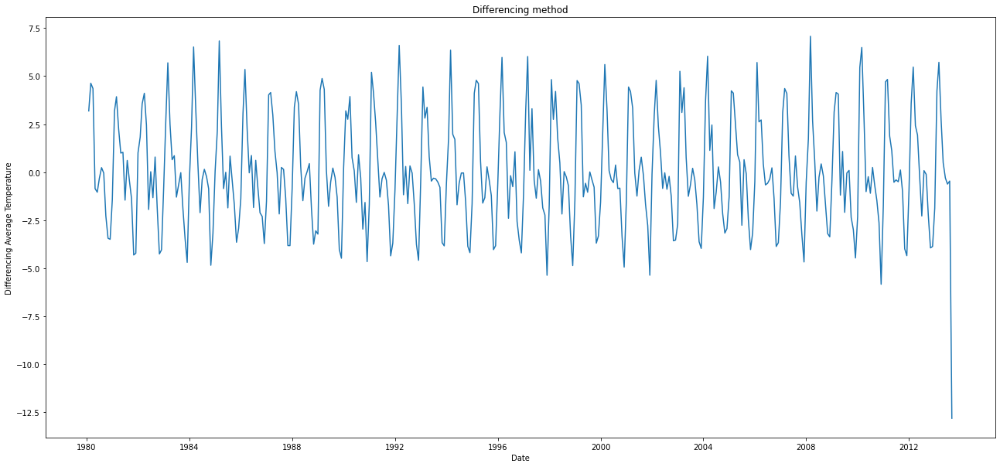

In [108]:
# differencing method
rs_diff = Calcutta_new_df - Calcutta_new_df.shift()
plt.figure(figsize=(22,10))
plt.plot(rs_diff)
plt.title("Differencing method") 
plt.xlabel("Date")
plt.ylabel("Differencing Average Temperature")
plt.show()

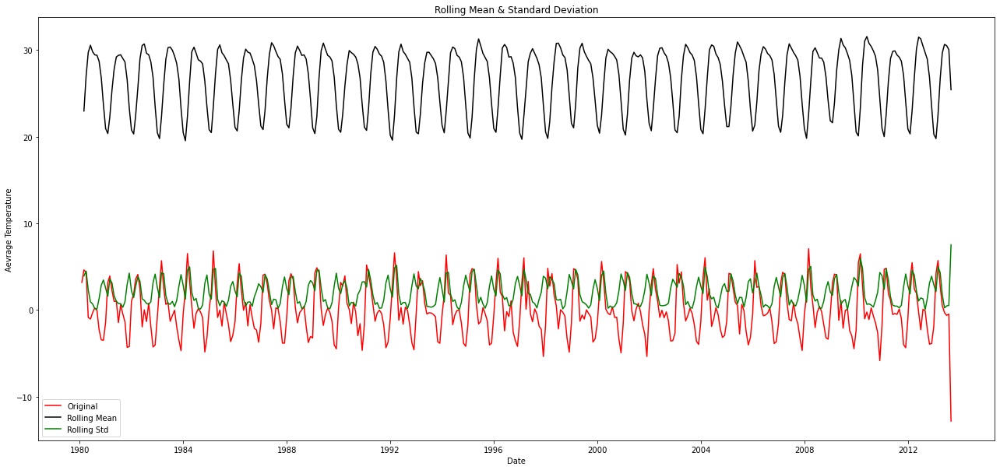

Test statistic:  -8.432132818977152
p-value:  1.8578804408741398e-13
Critical Values: {'1%': -3.4471856790801514, '5%': -2.868960436182993, '10%': -2.5707229006220524}


In [109]:
rs_diff.dropna(inplace=True) # due to shifting there is nan values
# check stationary: mean, variance(std)and adfuller test
check_mean_std(rs_diff)
check_adfuller(rs_diff.AverageTemperature)

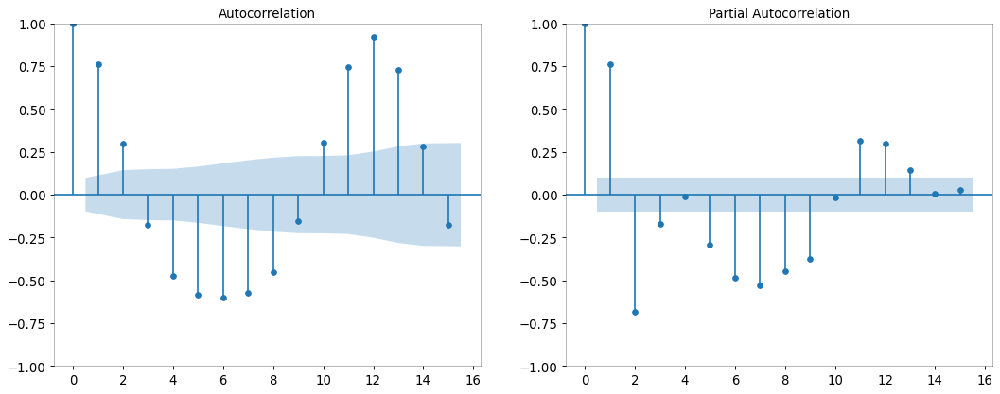

In [110]:
# ACF and PACF for resample data

ig, (ax1, ax2) = plt.subplots(1, 2,figsize=(16,6), dpi= 80)
plot_acf(Calcutta_new_df.AverageTemperature, ax=ax1, lags=15)
plot_pacf(Calcutta_new_df.AverageTemperature, ax=ax2, lags=15)


ax1.spines["top"].set_alpha(.3); ax2.spines["top"].set_alpha(.3)
ax1.spines["bottom"].set_alpha(.3); ax2.spines["bottom"].set_alpha(.3)
ax1.spines["right"].set_alpha(.3); ax2.spines["right"].set_alpha(.3)
ax1.spines["left"].set_alpha(.3); ax2.spines["left"].set_alpha(.3)

ax1.tick_params(axis='both', labelsize=12)
ax2.tick_params(axis='both', labelsize=12)
plt.show()

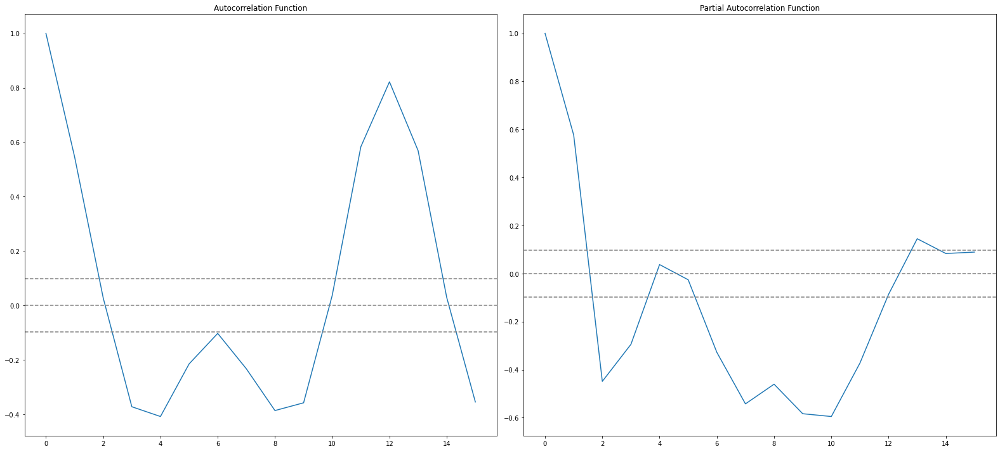

In [111]:
# ACF and PACF for resample data

lag_acf = acf(rs_diff, nlags=15)
lag_pacf = pacf(rs_diff, nlags=15, method='ols')
# ACF
plt.figure(figsize=(22,10))

plt.subplot(121) 
plt.plot(lag_acf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(rs_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(rs_diff)),linestyle='--',color='gray')
plt.title('Autocorrelation Function')

# PACF
plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(rs_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(rs_diff)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')
plt.tight_layout()

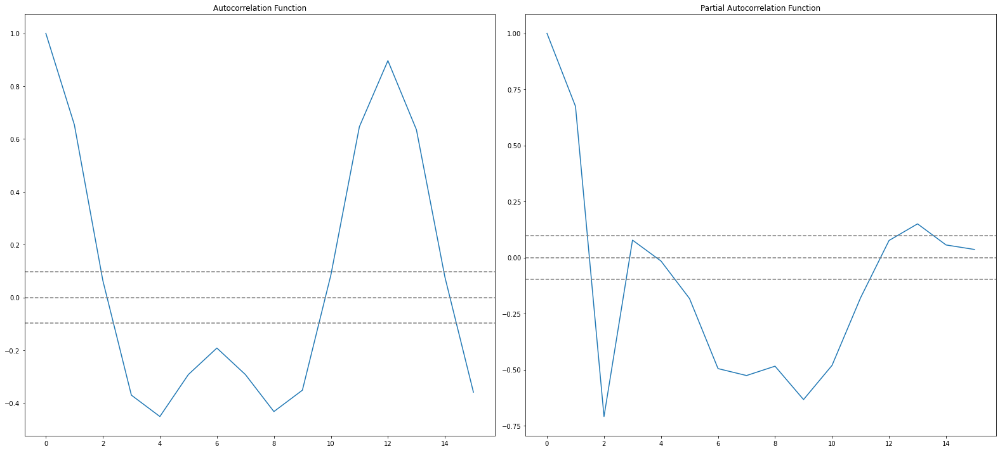

In [112]:
#ACF and PACF for moving AVG diff

lag_acf = acf(rs_moving_avg_diff, nlags=15)
lag_pacf = pacf(rs_moving_avg_diff, nlags=15, method='ols')
# ACF
plt.figure(figsize=(22,10))

plt.subplot(121) 
plt.plot(lag_acf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(rs_moving_avg_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(rs_moving_avg_diff)),linestyle='--',color='gray')
plt.title('Autocorrelation Function')

# PACF
plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(rs_moving_avg_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(rs_moving_avg_diff)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')
plt.tight_layout()

In [113]:
Calcutta_new_df.index


DatetimeIndex(['1980-01-01', '1980-02-01', '1980-03-01', '1980-04-01',
               '1980-05-01', '1980-06-01', '1980-07-01', '1980-08-01',
               '1980-09-01', '1980-10-01',
               ...
               '2012-12-01', '2013-01-01', '2013-02-01', '2013-03-01',
               '2013-04-01', '2013-05-01', '2013-06-01', '2013-07-01',
               '2013-08-01', '2013-09-01'],
              dtype='datetime64[ns]', name='dt', length=405, freq=None)

1.6190136782423827


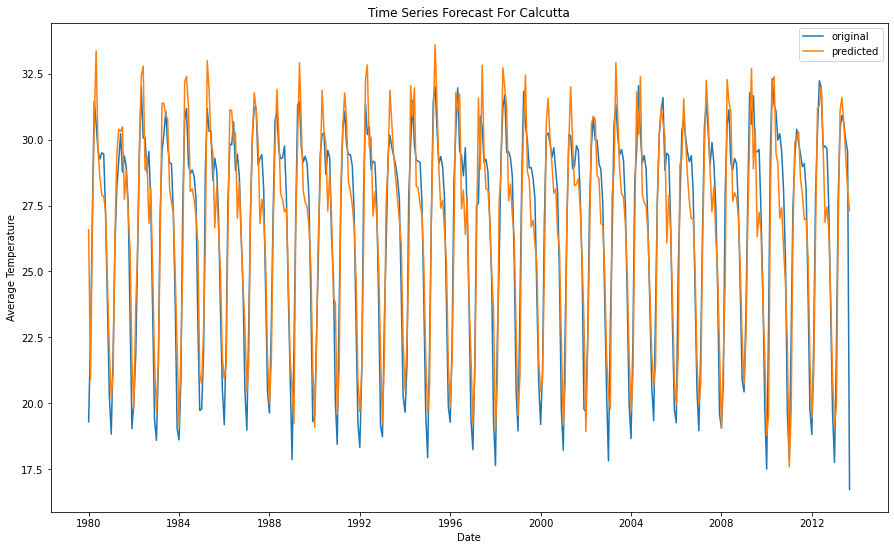

In [114]:

# fit model
model = sm.tsa.arima.ARIMA(Calcutta_new_df.AverageTemperature, order=(2,0,2)) # (ARIMA) = (1,0,1)
model_fit = model.fit()

# predict
start_index = datetime(1980, 1, 1)
end_index = datetime(2013, 9, 1)
forecast = model_fit.predict(start=start_index, end=end_index)
RMSE= np.sqrt(metrics.mean_squared_error(Calcutta_new_df, forecast))

print(RMSE)


# visualization
plt.figure(figsize=(15,9))
plt.plot(Calcutta_new_df.index,Calcutta_new_df.AverageTemperature,label = "original")
plt.plot(forecast,label = "predicted")
plt.title("Time Series Forecast For Calcutta")
plt.xlabel("Date")
plt.ylabel("Average Temperature")


plt.legend()
plt.show()

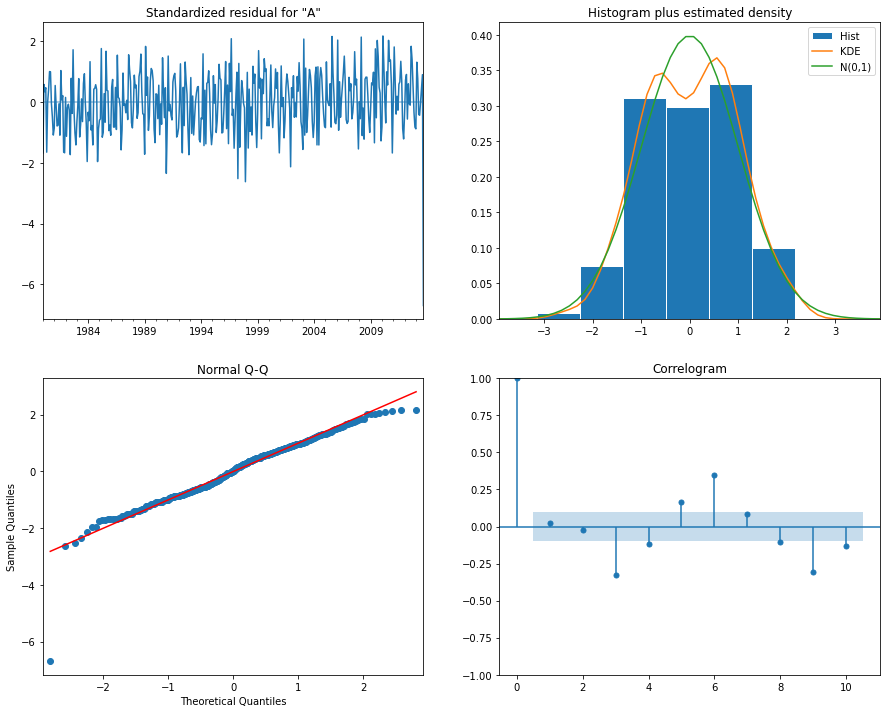

In [115]:
model_fit.plot_diagnostics(figsize=(15, 12))
plt.show()

In [116]:
pred_uc = model_fit.get_forecast(steps=120)
pred_ci = pred_uc.conf_int()

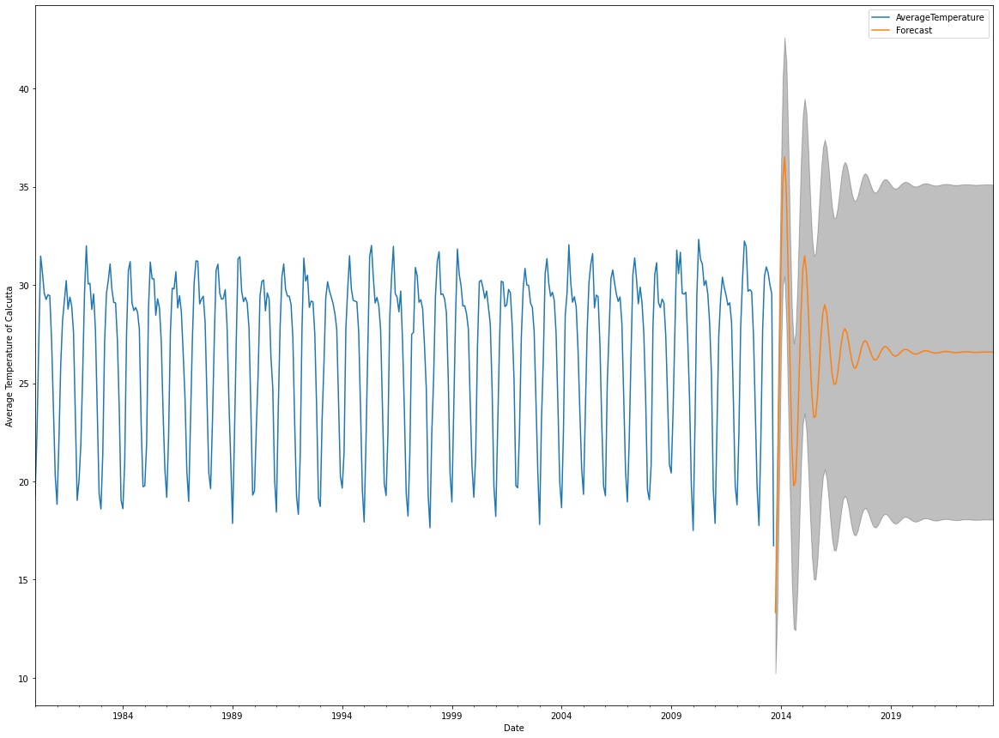

In [117]:
ax = Calcutta_new_df.plot(label='observed', figsize=(20, 15))
pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Average Temperature of Calcutta')

plt.legend()
plt.show()

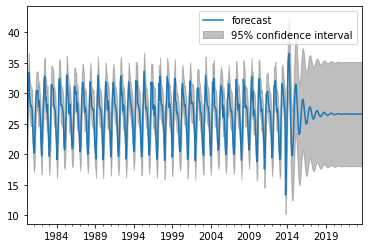

In [118]:
from statsmodels.graphics.tsaplots import plot_predict
plot_predict(model_fit,1,524,)
plt.show()

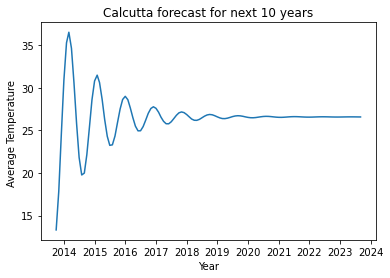

In [119]:
x3= model_fit.forecast(steps=120)
plt.xlabel('Year')
plt.ylabel('Average Temperature ')
plt.title('Calcutta forecast for next 10 years')
plt.plot(x3)

# **AGRA**

In [120]:
Agra_df=new_df[new_df['City']=='Agra']


In [121]:
Agra_df


,AverageTemperature,City
dt,,
1980-01-01,15.335000,Agra
1980-02-01,19.549000,Agra
1980-03-01,23.958000,Agra
1980-04-01,31.741000,Agra
1980-05-01,36.270000,Agra
...,...,...
2013-05-01,35.233000,Agra
2013-06-01,32.531000,Agra
2013-07-01,30.192000,Agra


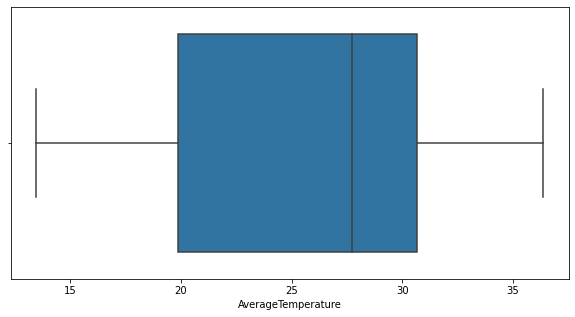

In [122]:
plt.figure(figsize = (10,5))
sns.boxplot(x = 'AverageTemperature', data = Agra_df)
plt.show()

In [123]:
q1 = Agra_df['AverageTemperature'].quantile(.25)
q3 = Agra_df['AverageTemperature'].quantile(.75)

In [124]:
def outliers(Agra_df, feature):
    Q1= Agra_df[feature].quantile(0.25)
    Q3 = Agra_df[feature].quantile(0.75)
    IQR = Q3 - Q1
    upper_limit = Q3 + 1.5 * IQR
    lower_limit = Q1 - 1.5 * IQR
    return upper_limit, lower_limit
upper, lower = outliers(Agra_df, "AverageTemperature")
print("Upper whisker: ", upper)
print("Lower Whisker: ", lower)

Upper whisker:  46.86099999999999
Lower Whisker:  3.645000000000021


In [125]:
Agra_df[(Agra_df['AverageTemperature'] < lower) | (Agra_df['AverageTemperature'] > upper)]

,AverageTemperature,City
dt,,


In [126]:
Agra_new_df = Agra_df[(Agra_df['AverageTemperature'] > lower) & (Agra_df['AverageTemperature'] < upper)]

In [127]:
Agra_new_df

,AverageTemperature,City
dt,,
1980-01-01,15.335000,Agra
1980-02-01,19.549000,Agra
1980-03-01,23.958000,Agra
1980-04-01,31.741000,Agra
1980-05-01,36.270000,Agra
...,...,...
2013-05-01,35.233000,Agra
2013-06-01,32.531000,Agra
2013-07-01,30.192000,Agra


In [128]:
drop_list=['City']
Agra_new_df.drop(drop_list,axis=1,inplace=True)


In [129]:
Agra_new_df

,AverageTemperature
dt,
1980-01-01,15.335000
1980-02-01,19.549000
1980-03-01,23.958000
1980-04-01,31.741000
1980-05-01,36.270000
...,...
2013-05-01,35.233000
2013-06-01,32.531000
2013-07-01,30.192000


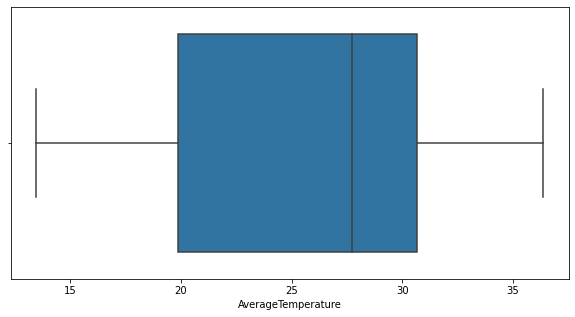

In [130]:
plt.figure(figsize = (10,5))
sns.boxplot(x = 'AverageTemperature', data = Agra_new_df)
plt.show()

In [131]:
Agra_new_df

,AverageTemperature
dt,
1980-01-01,15.335000
1980-02-01,19.549000
1980-03-01,23.958000
1980-04-01,31.741000
1980-05-01,36.270000
...,...
2013-05-01,35.233000
2013-06-01,32.531000
2013-07-01,30.192000


<AxesSubplot:xlabel='dt', ylabel='AverageTemperature'>

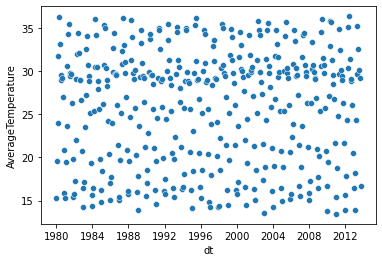

In [132]:
sns.scatterplot(data=Agra_new_df, x="dt", y="AverageTemperature")

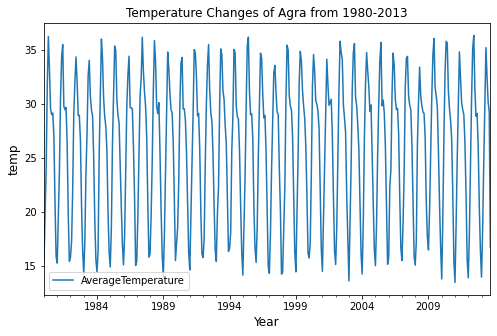

In [133]:
Agra_new_df.plot(title='Temperature Changes of Agra from 1980-2013',figsize=(8,5))
plt.ylabel('temp',fontsize=12)
plt.xlabel('Year',fontsize=12)
plt.legend()

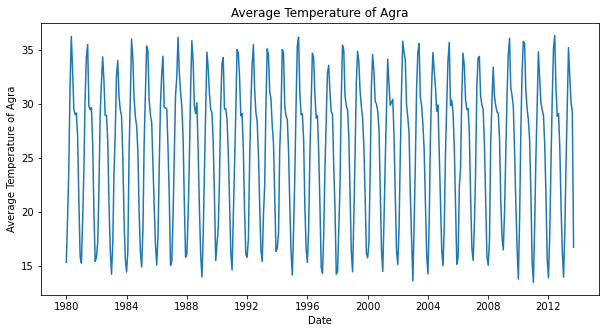

In [134]:
plt.figure(figsize=(10,5))
plt.plot(Agra_new_df.index,Agra_new_df.AverageTemperature)
plt.title("Average Temperature of Agra")
plt.xlabel("Date")
plt.ylabel("Average Temperature of Agra")
plt.show()

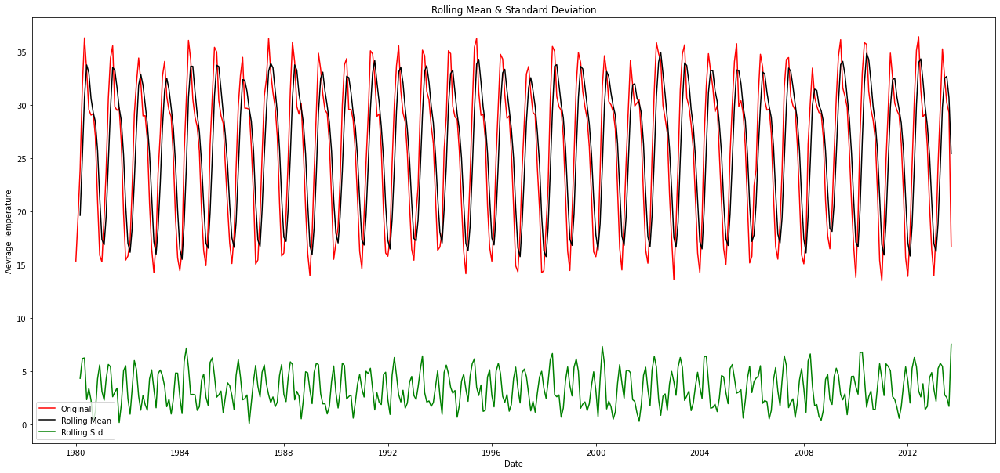

Test statistic:  -3.2970376511825203
p-value:  0.015011411973202542
Critical Values: {'1%': -3.4472291365835566, '5%': -2.8689795375849223, '10%': -2.5707330834976987}


In [135]:
# adfuller library 

# check_adfuller
def check_adfuller(ts):
    # Dickey-Fuller test
    result = adfuller(ts, autolag='AIC')
    print('Test statistic: ' , result[0])
    print('p-value: '  ,result[1])
    print('Critical Values:' ,result[4])
# check_mean_std
def check_mean_std(ts):
    #Rolling statistics
    rolmean = Agra_new_df.rolling( window=3).mean()
    rolstd = Agra_new_df.rolling( window=3).std()
    plt.figure(figsize=(22,10))   
    orig = plt.plot(ts, color='red',label='Original')
    mean = plt.plot(rolmean, color='black', label='Rolling Mean')
    std = plt.plot(rolstd, color='green', label = 'Rolling Std')
    plt.xlabel("Date")
    plt.ylabel("Aevrage Temperature")
    plt.title('Rolling Mean & Standard Deviation')
    plt.legend()
    plt.show()
    
# check stationary: mean, variance(std)and adfuller test
check_mean_std(Agra_new_df)
check_adfuller(Agra_new_df.AverageTemperature)

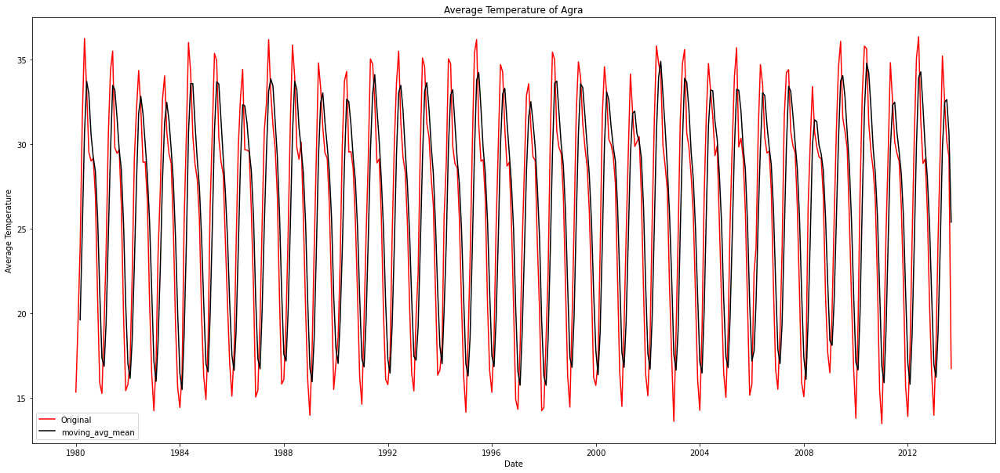

In [136]:
window_size = 3
moving_avg = Agra_new_df.rolling(window_size).mean()
plt.figure(figsize=(22,10))
plt.plot(Agra_new_df, color = "red",label = "Original")
plt.plot(moving_avg, color='black', label = "moving_avg_mean")
plt.title("Average Temperature of Agra")
plt.xlabel("Date")
plt.ylabel("Average Temperature")
plt.legend()
plt.show()

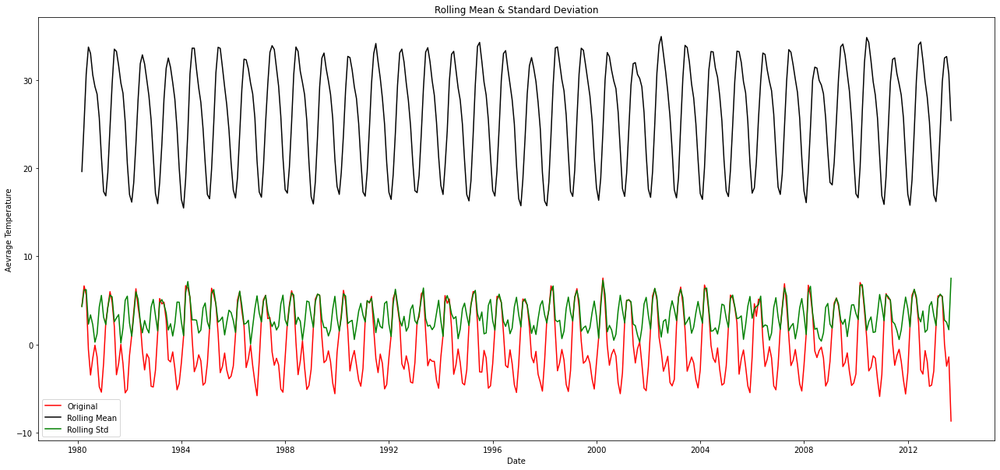

Test statistic:  -7.4077286426019935
p-value:  7.269854786892892e-11
Critical Values: {'1%': -3.4472291365835566, '5%': -2.8689795375849223, '10%': -2.5707330834976987}


In [137]:
rs_moving_avg_diff =Agra_new_df - moving_avg
rs_moving_avg_diff.dropna(inplace=True) # first 6 is nan value due to window size

# check stationary: mean, variance(std)and adfuller test
check_mean_std(rs_moving_avg_diff)
check_adfuller(rs_moving_avg_diff.AverageTemperature)

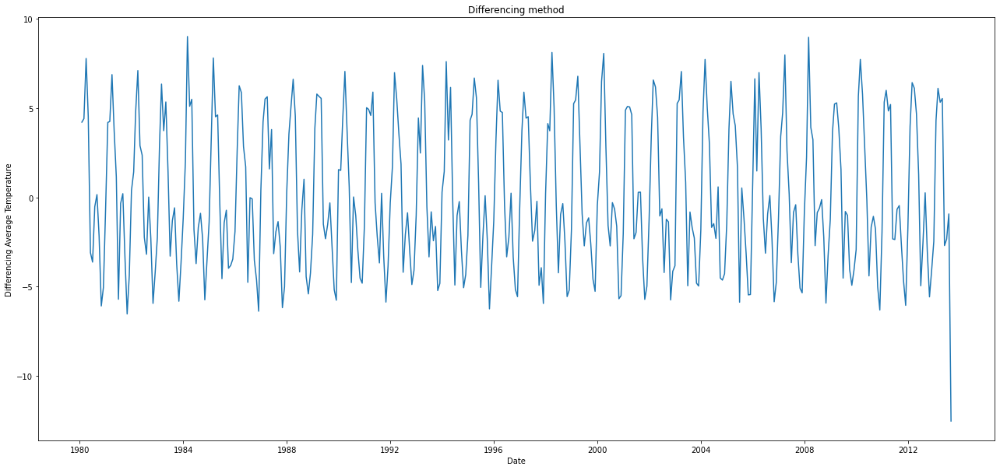

In [138]:
# differencing method
rs_diff = Agra_new_df - Agra_new_df.shift()
plt.figure(figsize=(22,10))
plt.plot(rs_diff)
plt.title("Differencing method") 
plt.xlabel("Date")
plt.ylabel("Differencing Average Temperature")
plt.show()

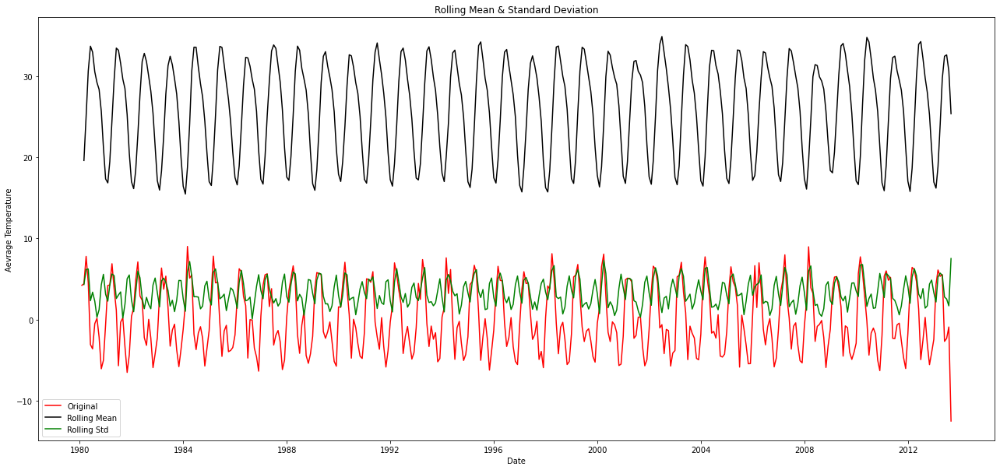

Test statistic:  -8.95520130151772
p-value:  8.511129496108578e-15
Critical Values: {'1%': -3.4471856790801514, '5%': -2.868960436182993, '10%': -2.5707229006220524}


In [139]:
rs_diff.dropna(inplace=True) # due to shifting there is nan values
# check stationary: mean, variance(std)and adfuller test
check_mean_std(rs_diff)
check_adfuller(rs_diff.AverageTemperature)

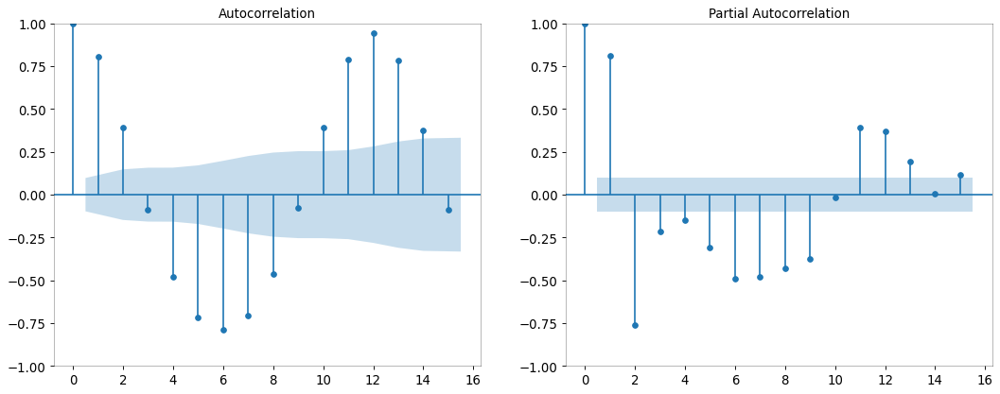

In [140]:
# ACF and PACF for resample data

ig, (ax1, ax2) = plt.subplots(1, 2,figsize=(16,6), dpi= 80)
plot_acf(Agra_new_df.AverageTemperature, ax=ax1, lags=15)
plot_pacf(Agra_new_df.AverageTemperature, ax=ax2, lags=15)


ax1.spines["top"].set_alpha(.3); ax2.spines["top"].set_alpha(.3)
ax1.spines["bottom"].set_alpha(.3); ax2.spines["bottom"].set_alpha(.3)
ax1.spines["right"].set_alpha(.3); ax2.spines["right"].set_alpha(.3)
ax1.spines["left"].set_alpha(.3); ax2.spines["left"].set_alpha(.3)

ax1.tick_params(axis='both', labelsize=12)
ax2.tick_params(axis='both', labelsize=12)
plt.show()

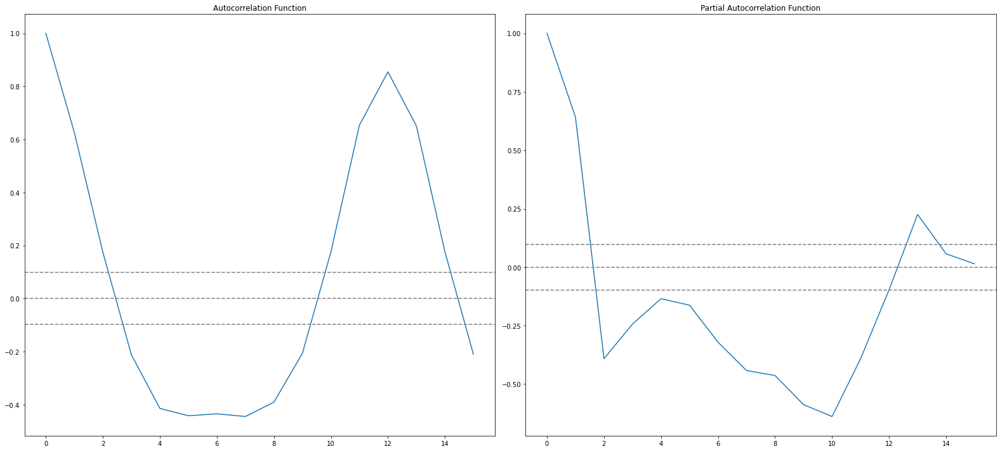

In [141]:
# ACF and PACF for resample data

lag_acf = acf(rs_diff, nlags=15)
lag_pacf = pacf(rs_diff, nlags=15, method='ols')
# ACF
plt.figure(figsize=(22,10))

plt.subplot(121) 
plt.plot(lag_acf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(rs_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(rs_diff)),linestyle='--',color='gray')
plt.title('Autocorrelation Function')

# PACF
plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(rs_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(rs_diff)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')
plt.tight_layout()

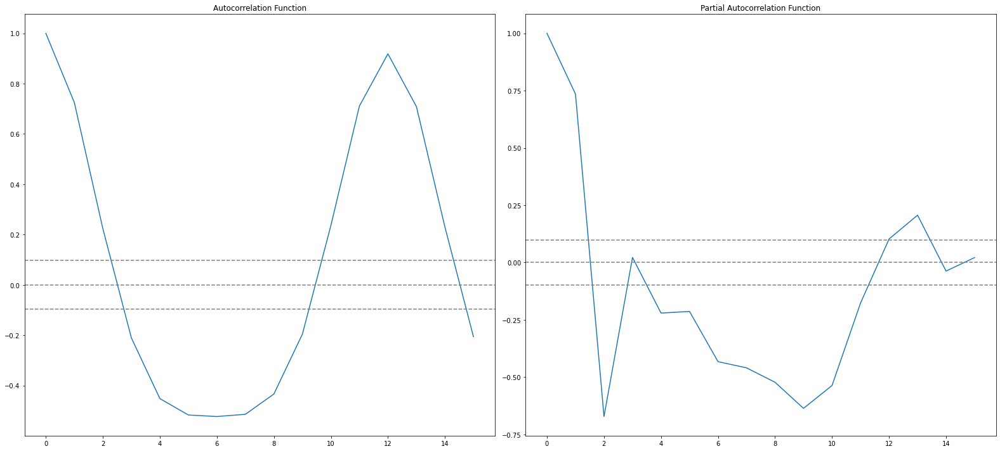

In [142]:
#ACF and PACF for moving AVG diff

lag_acf = acf(rs_moving_avg_diff, nlags=15)
lag_pacf = pacf(rs_moving_avg_diff, nlags=15, method='ols')
# ACF
plt.figure(figsize=(22,10))

plt.subplot(121) 
plt.plot(lag_acf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(rs_moving_avg_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(rs_moving_avg_diff)),linestyle='--',color='gray')
plt.title('Autocorrelation Function')

# PACF
plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(rs_moving_avg_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(rs_moving_avg_diff)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')
plt.tight_layout()

In [143]:
Agra_new_df.index


DatetimeIndex(['1980-01-01', '1980-02-01', '1980-03-01', '1980-04-01',
               '1980-05-01', '1980-06-01', '1980-07-01', '1980-08-01',
               '1980-09-01', '1980-10-01',
               ...
               '2012-12-01', '2013-01-01', '2013-02-01', '2013-03-01',
               '2013-04-01', '2013-05-01', '2013-06-01', '2013-07-01',
               '2013-08-01', '2013-09-01'],
              dtype='datetime64[ns]', name='dt', length=405, freq=None)

2.0802339560517633


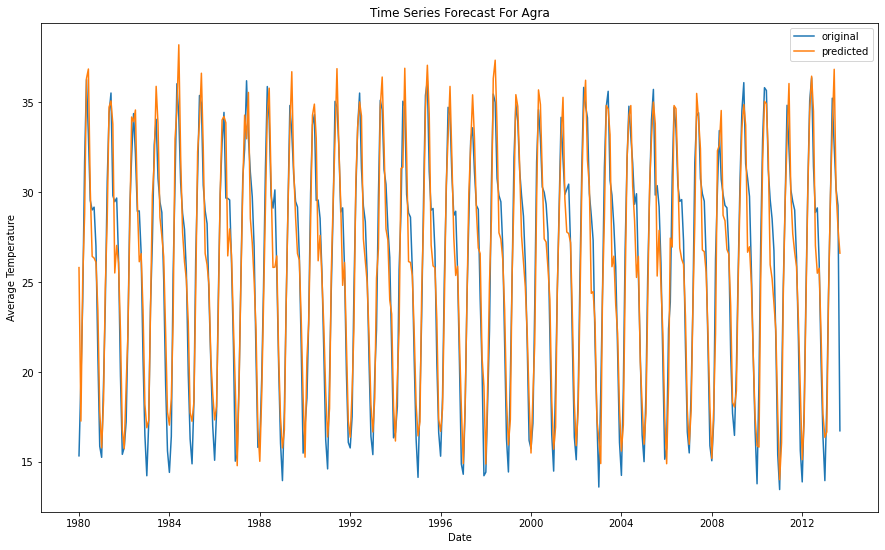

In [144]:

# fit model
model = sm.tsa.arima.ARIMA(Agra_new_df.AverageTemperature, order=(3,0,2)) # (ARIMA) = (1,0,1)
model_fit = model.fit()

# predict
start_index = datetime(1980, 1, 1)
end_index = datetime(2013, 9, 1)
forecast = model_fit.predict(start=start_index, end=end_index)
RMSE= np.sqrt(metrics.mean_squared_error(Agra_new_df, forecast))

print(RMSE)


# visualization
plt.figure(figsize=(15,9))
plt.plot(Agra_new_df.index,Agra_new_df.AverageTemperature,label = "original")
plt.plot(forecast,label = "predicted")
plt.title("Time Series Forecast For Agra")
plt.xlabel("Date")
plt.ylabel("Average Temperature")


plt.legend()
plt.show()

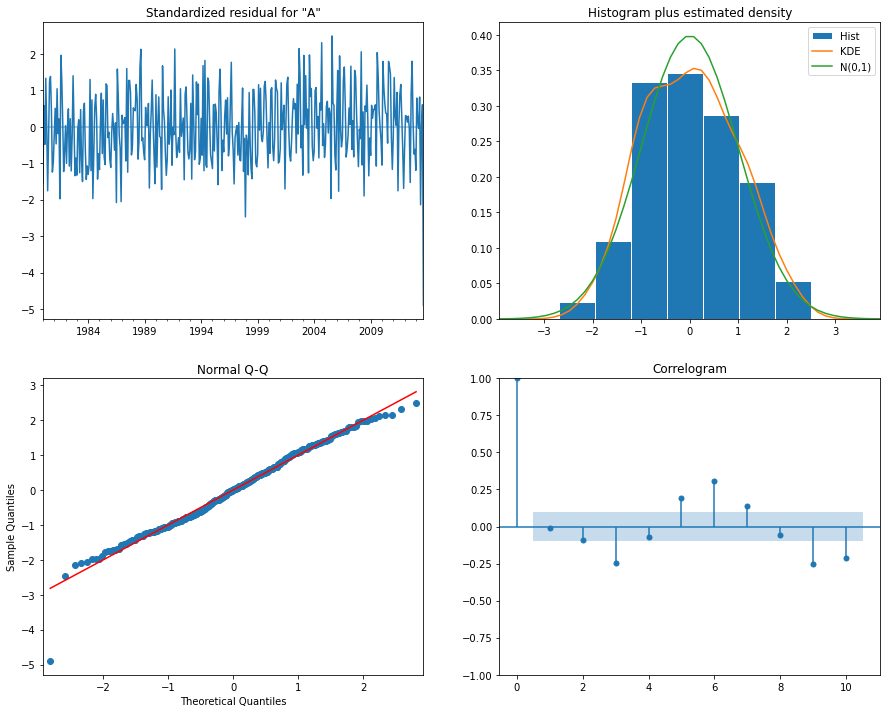

In [145]:
model_fit.plot_diagnostics(figsize=(15, 12))
plt.show()

In [146]:
pred_uc = model_fit.get_forecast(steps=120)
pred_ci = pred_uc.conf_int()

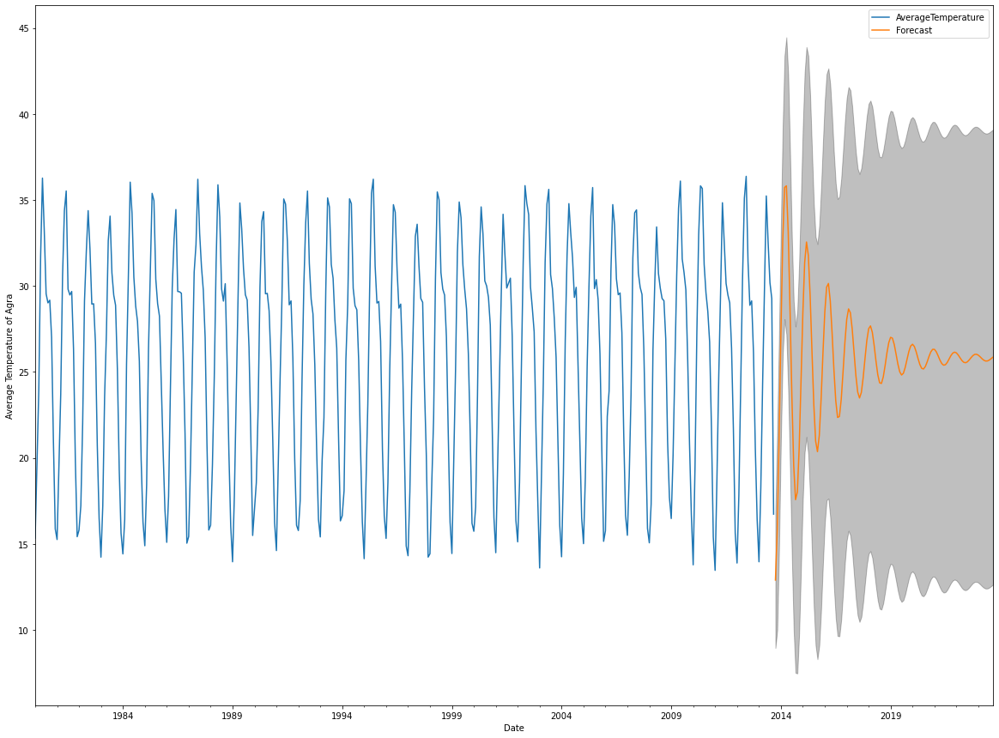

In [147]:
ax = Agra_new_df.plot(label='observed', figsize=(20, 15))
pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Average Temperature of Agra')

plt.legend()
plt.show()

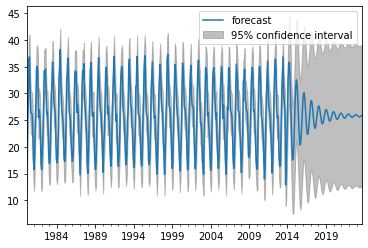

In [148]:
from statsmodels.graphics.tsaplots import plot_predict
plot_predict(model_fit,1,524,)
plt.show()

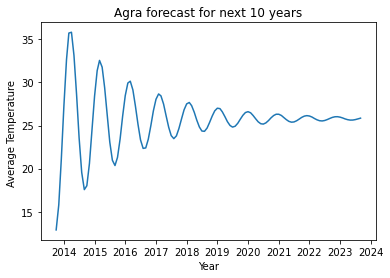

In [149]:
x4= model_fit.forecast(steps=120)
plt.xlabel('Year')
plt.ylabel('Average Temperature ')
plt.title('Agra forecast for next 10 years')
plt.plot(x4)

# **AHMADABAD**

In [150]:
Ahmadabad_df=new_df[new_df['City']=='Ahmadabad']


In [151]:
Ahmadabad_df


,AverageTemperature,City
dt,,
1980-01-01,19.727000,Ahmadabad
1980-02-01,22.759000,Ahmadabad
1980-03-01,26.703000,Ahmadabad
1980-04-01,32.318000,Ahmadabad
1980-05-01,33.849000,Ahmadabad
...,...,...
2013-05-01,33.856000,Ahmadabad
2013-06-01,31.099000,Ahmadabad
2013-07-01,28.073000,Ahmadabad


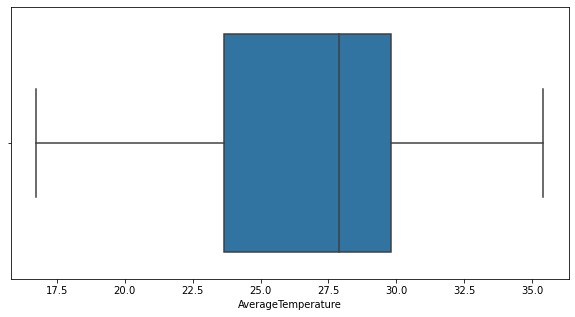

In [152]:
plt.figure(figsize = (10,5))
sns.boxplot(x = 'AverageTemperature', data = Ahmadabad_df)
plt.show()

In [153]:
q1 = Ahmadabad_df['AverageTemperature'].quantile(.25)
q3 = Ahmadabad_df['AverageTemperature'].quantile(.75)

In [154]:
def outliers(Ahmadabad_df, feature):
    Q1= Ahmadabad_df[feature].quantile(0.25)
    Q3 = Ahmadabad_df[feature].quantile(0.75)
    IQR = Q3 - Q1
    upper_limit = Q3 + 1.5 * IQR
    lower_limit = Q1 - 1.5 * IQR
    return upper_limit, lower_limit
upper, lower = outliers(Ahmadabad_df, "AverageTemperature")
print("Upper whisker: ", upper)
print("Lower Whisker: ", lower)

Upper whisker:  39.084
Lower Whisker:  14.379999999999995


In [155]:
Ahmadabad_df[(Ahmadabad_df['AverageTemperature'] < lower) | (Ahmadabad_df['AverageTemperature'] > upper)]


,AverageTemperature,City
dt,,


In [156]:
Ahmadabad_new_df = Ahmadabad_df[(Ahmadabad_df['AverageTemperature'] > lower) & (Ahmadabad_df['AverageTemperature'] < upper)]


In [157]:
Ahmadabad_new_df

,AverageTemperature,City
dt,,
1980-01-01,19.727000,Ahmadabad
1980-02-01,22.759000,Ahmadabad
1980-03-01,26.703000,Ahmadabad
1980-04-01,32.318000,Ahmadabad
1980-05-01,33.849000,Ahmadabad
...,...,...
2013-05-01,33.856000,Ahmadabad
2013-06-01,31.099000,Ahmadabad
2013-07-01,28.073000,Ahmadabad


In [158]:
drop_list=['City']
Ahmadabad_new_df.drop(drop_list,axis=1,inplace=True)


In [159]:
Ahmadabad_new_df

,AverageTemperature
dt,
1980-01-01,19.727000
1980-02-01,22.759000
1980-03-01,26.703000
1980-04-01,32.318000
1980-05-01,33.849000
...,...
2013-05-01,33.856000
2013-06-01,31.099000
2013-07-01,28.073000


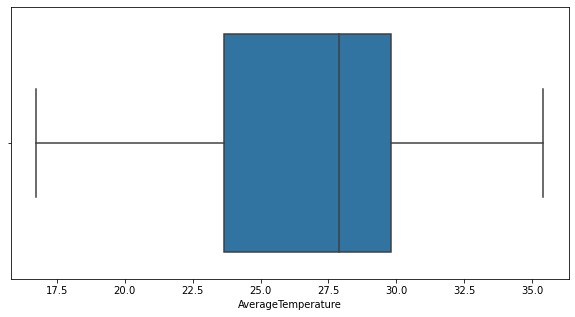

In [160]:
plt.figure(figsize = (10,5))
sns.boxplot(x = 'AverageTemperature', data = Ahmadabad_new_df)
plt.show()

In [161]:
Ahmadabad_new_df


,AverageTemperature
dt,
1980-01-01,19.727000
1980-02-01,22.759000
1980-03-01,26.703000
1980-04-01,32.318000
1980-05-01,33.849000
...,...
2013-05-01,33.856000
2013-06-01,31.099000
2013-07-01,28.073000


<AxesSubplot:xlabel='dt', ylabel='AverageTemperature'>

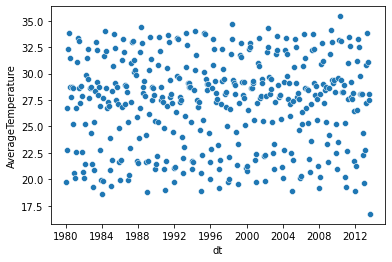

In [162]:
sns.scatterplot(data=Ahmadabad_new_df, x="dt", y="AverageTemperature")


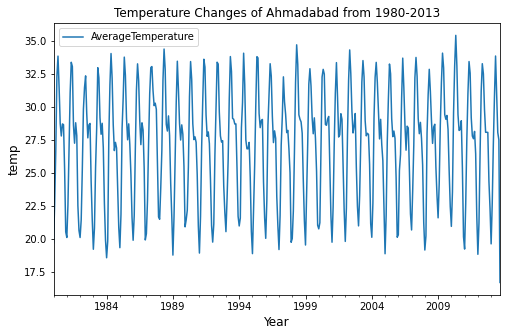

In [163]:
Ahmadabad_new_df.plot(title='Temperature Changes of Ahmadabad from 1980-2013',figsize=(8,5))
plt.ylabel('temp',fontsize=12)
plt.xlabel('Year',fontsize=12)
plt.legend()

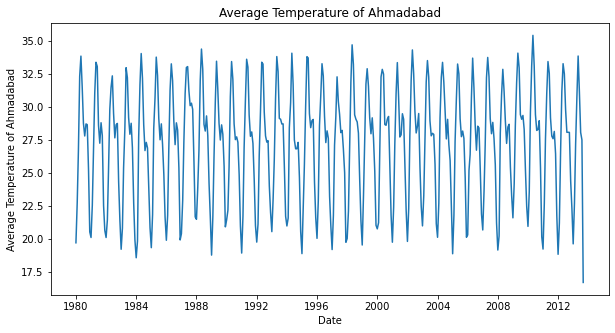

In [164]:
plt.figure(figsize=(10,5))
plt.plot(Ahmadabad_new_df.index,Ahmadabad_new_df.AverageTemperature)
plt.title("Average Temperature of Ahmadabad")
plt.xlabel("Date")
plt.ylabel("Average Temperature of Ahmadabad")
plt.show()

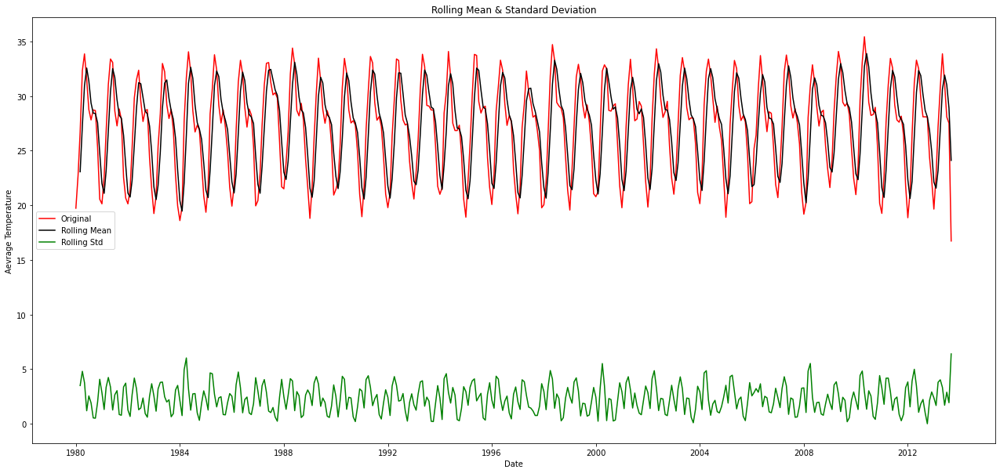

Test statistic:  -3.4427154163083635
p-value:  0.009586087787572563
Critical Values: {'1%': -3.4472291365835566, '5%': -2.8689795375849223, '10%': -2.5707330834976987}


In [165]:
# adfuller library 

# check_adfuller
def check_adfuller(ts):
    # Dickey-Fuller test
    result = adfuller(ts, autolag='AIC')
    print('Test statistic: ' , result[0])
    print('p-value: '  ,result[1])
    print('Critical Values:' ,result[4])
# check_mean_std
def check_mean_std(ts):
    #Rolling statistics
    rolmean = Ahmadabad_new_df.rolling( window=3).mean()
    rolstd = Ahmadabad_new_df.rolling( window=3).std()
    plt.figure(figsize=(22,10))   
    orig = plt.plot(ts, color='red',label='Original')
    mean = plt.plot(rolmean, color='black', label='Rolling Mean')
    std = plt.plot(rolstd, color='green', label = 'Rolling Std')
    plt.xlabel("Date")
    plt.ylabel("Aevrage Temperature")
    plt.title('Rolling Mean & Standard Deviation')
    plt.legend()
    plt.show()
    
# check stationary: mean, variance(std)and adfuller test
check_mean_std(Ahmadabad_new_df)
check_adfuller(Ahmadabad_new_df.AverageTemperature)

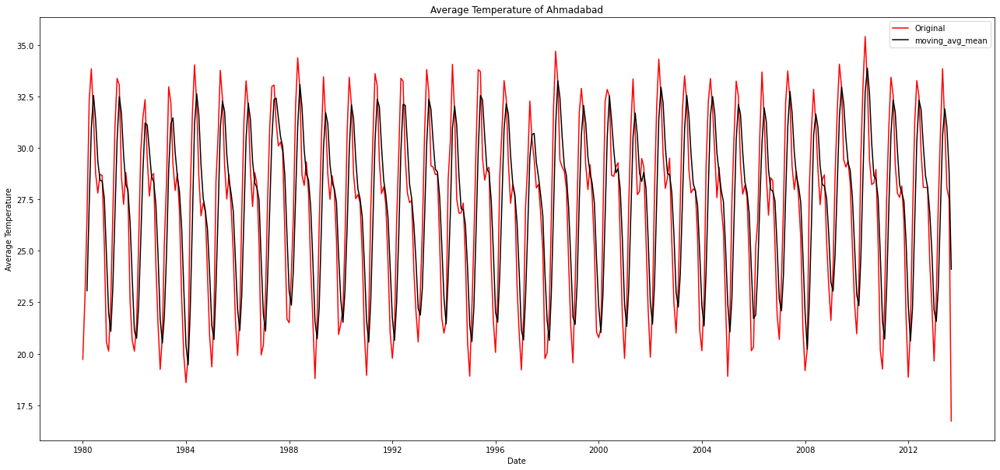

In [166]:
window_size = 3
moving_avg = Ahmadabad_new_df.rolling(window_size).mean()
plt.figure(figsize=(22,10))
plt.plot(Ahmadabad_new_df, color = "red",label = "Original")
plt.plot(moving_avg, color='black', label = "moving_avg_mean")
plt.title("Average Temperature of Ahmadabad")
plt.xlabel("Date")
plt.ylabel("Average Temperature")
plt.legend()
plt.show()

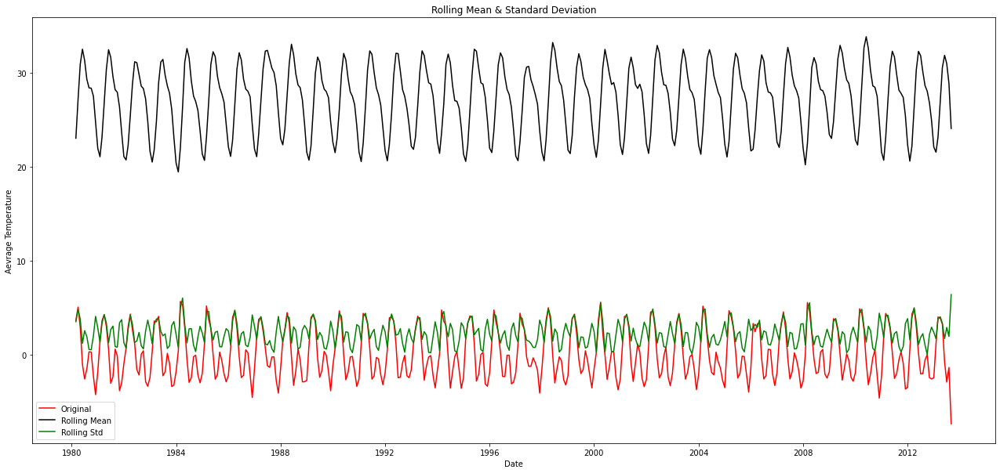

Test statistic:  -6.048206783670356
p-value:  1.2964404505422776e-07
Critical Values: {'1%': -3.4472291365835566, '5%': -2.8689795375849223, '10%': -2.5707330834976987}


In [167]:
rs_moving_avg_diff =Ahmadabad_new_df - moving_avg
rs_moving_avg_diff.dropna(inplace=True) # first 6 is nan value due to window size

# check stationary: mean, variance(std)and adfuller test
check_mean_std(rs_moving_avg_diff)
check_adfuller(rs_moving_avg_diff.AverageTemperature)

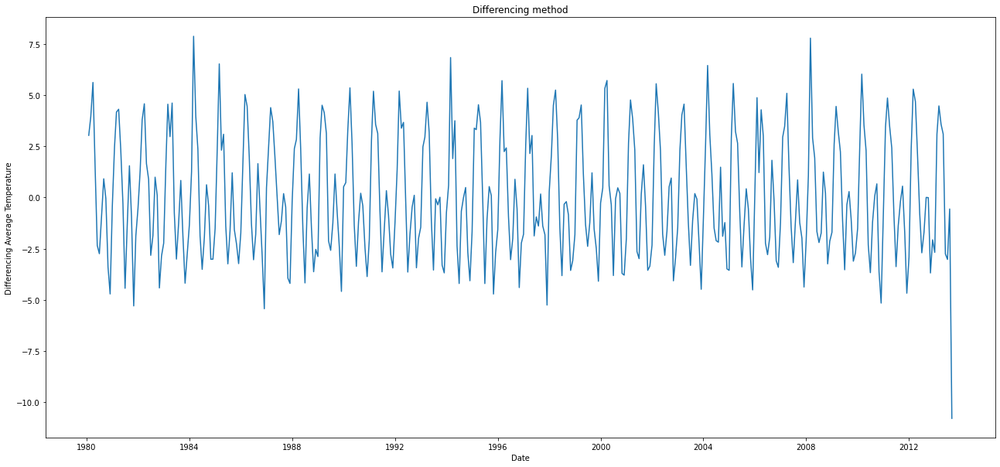

In [168]:
# differencing method
rs_diff = Ahmadabad_new_df - Ahmadabad_new_df.shift()
plt.figure(figsize=(22,10))
plt.plot(rs_diff)
plt.title("Differencing method") 
plt.xlabel("Date")
plt.ylabel("Differencing Average Temperature")
plt.show()

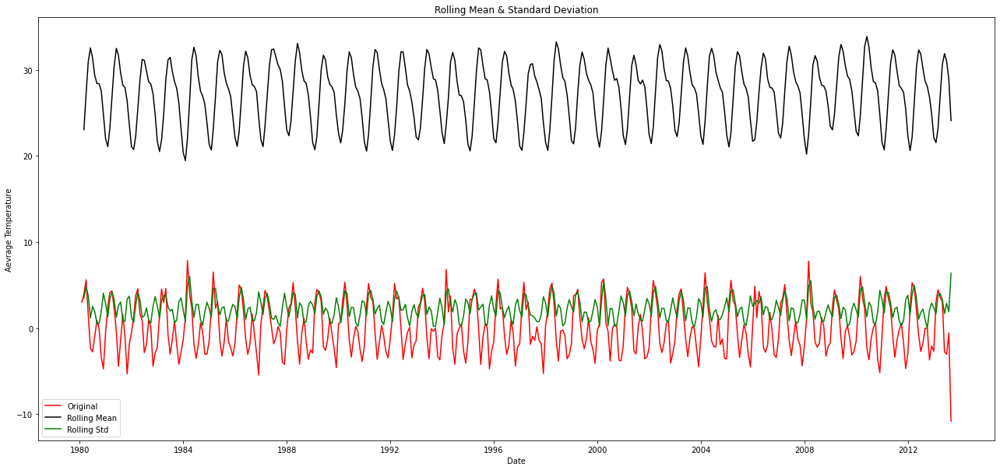

Test statistic:  -7.142300965266617
p-value:  3.3000548269609854e-10
Critical Values: {'1%': -3.4471856790801514, '5%': -2.868960436182993, '10%': -2.5707229006220524}


In [169]:
rs_diff.dropna(inplace=True) # due to shifting there is nan values
# check stationary: mean, variance(std)and adfuller test
check_mean_std(rs_diff)
check_adfuller(rs_diff.AverageTemperature)

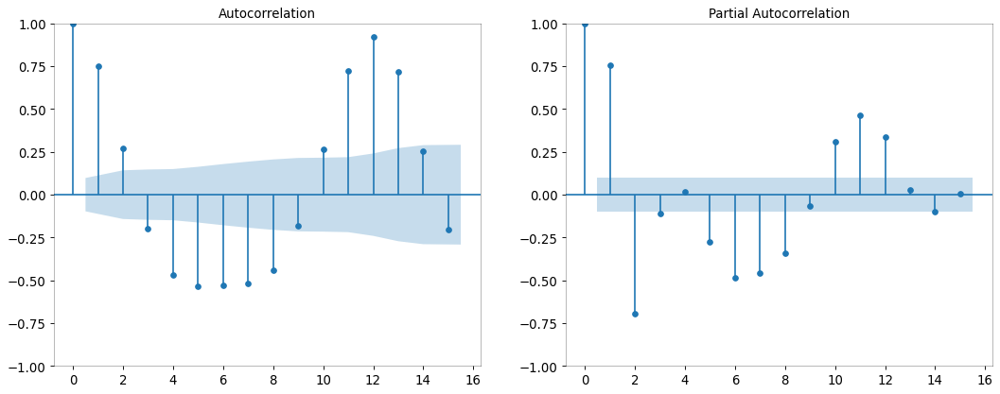

In [170]:
# ACF and PACF for resample data

ig, (ax1, ax2) = plt.subplots(1, 2,figsize=(16,6), dpi= 80)
plot_acf(Ahmadabad_new_df.AverageTemperature, ax=ax1, lags=15)
plot_pacf(Ahmadabad_new_df.AverageTemperature, ax=ax2, lags=15)


ax1.spines["top"].set_alpha(.3); ax2.spines["top"].set_alpha(.3)
ax1.spines["bottom"].set_alpha(.3); ax2.spines["bottom"].set_alpha(.3)
ax1.spines["right"].set_alpha(.3); ax2.spines["right"].set_alpha(.3)
ax1.spines["left"].set_alpha(.3); ax2.spines["left"].set_alpha(.3)

ax1.tick_params(axis='both', labelsize=12)
ax2.tick_params(axis='both', labelsize=12)
plt.show()

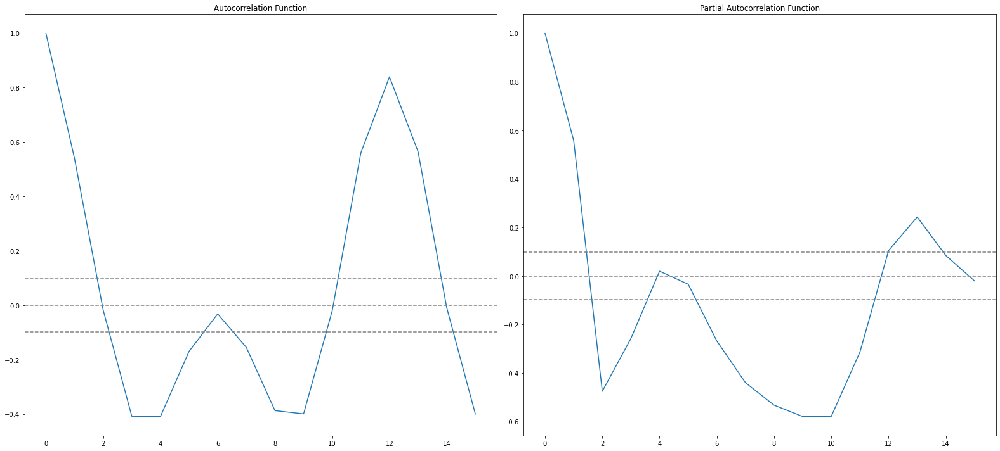

In [171]:
# ACF and PACF for resample data

lag_acf = acf(rs_diff, nlags=15)
lag_pacf = pacf(rs_diff, nlags=15, method='ols')
# ACF
plt.figure(figsize=(22,10))

plt.subplot(121) 
plt.plot(lag_acf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(rs_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(rs_diff)),linestyle='--',color='gray')
plt.title('Autocorrelation Function')

# PACF
plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(rs_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(rs_diff)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')
plt.tight_layout()

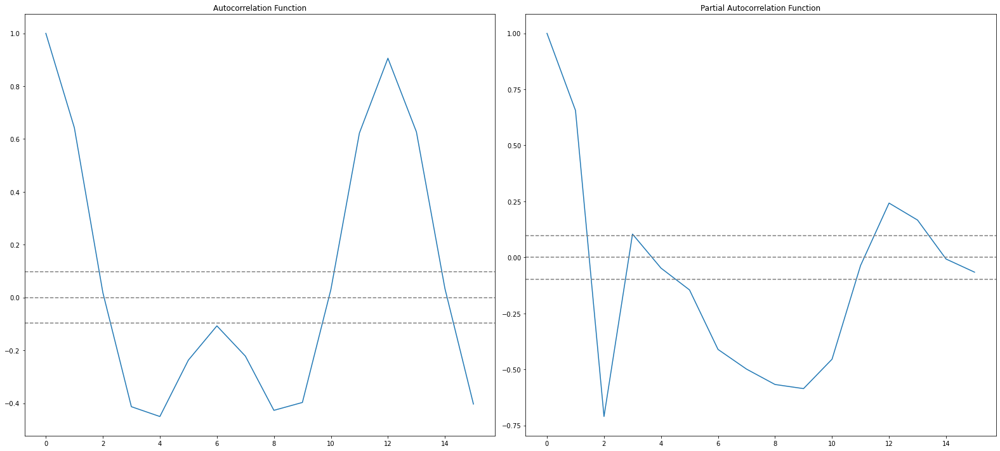

In [172]:
#ACF and PACF for moving AVG diff

lag_acf = acf(rs_moving_avg_diff, nlags=15)
lag_pacf = pacf(rs_moving_avg_diff, nlags=15, method='ols')
# ACF
plt.figure(figsize=(22,10))

plt.subplot(121) 
plt.plot(lag_acf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(rs_moving_avg_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(rs_moving_avg_diff)),linestyle='--',color='gray')
plt.title('Autocorrelation Function')

# PACF
plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(rs_moving_avg_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(rs_moving_avg_diff)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')
plt.tight_layout()

In [173]:
Ahmadabad_new_df.index


DatetimeIndex(['1980-01-01', '1980-02-01', '1980-03-01', '1980-04-01',
               '1980-05-01', '1980-06-01', '1980-07-01', '1980-08-01',
               '1980-09-01', '1980-10-01',
               ...
               '2012-12-01', '2013-01-01', '2013-02-01', '2013-03-01',
               '2013-04-01', '2013-05-01', '2013-06-01', '2013-07-01',
               '2013-08-01', '2013-09-01'],
              dtype='datetime64[ns]', name='dt', length=405, freq=None)

1.7548964613327276


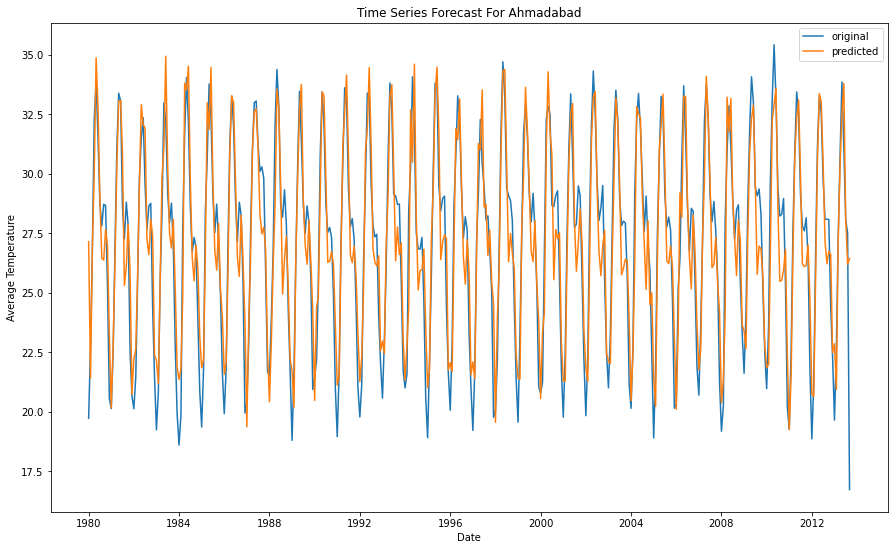

In [174]:

# fit model
model = sm.tsa.arima.ARIMA(Ahmadabad_new_df.AverageTemperature, order=(2,0,2)) # (ARIMA) = (1,0,1)
model_fit = model.fit()

# predict
start_index = datetime(1980, 1, 1)
end_index = datetime(2013, 9, 1)
forecast = model_fit.predict(start=start_index, end=end_index)
RMSE= np.sqrt(metrics.mean_squared_error(Ahmadabad_new_df, forecast))

print(RMSE)


# visualization
plt.figure(figsize=(15,9))
plt.plot(Ahmadabad_new_df.index,Ahmadabad_new_df.AverageTemperature,label = "original")
plt.plot(forecast,label = "predicted")
plt.title("Time Series Forecast For Ahmadabad")
plt.xlabel("Date")
plt.ylabel("Average Temperature")


plt.legend()
plt.show()

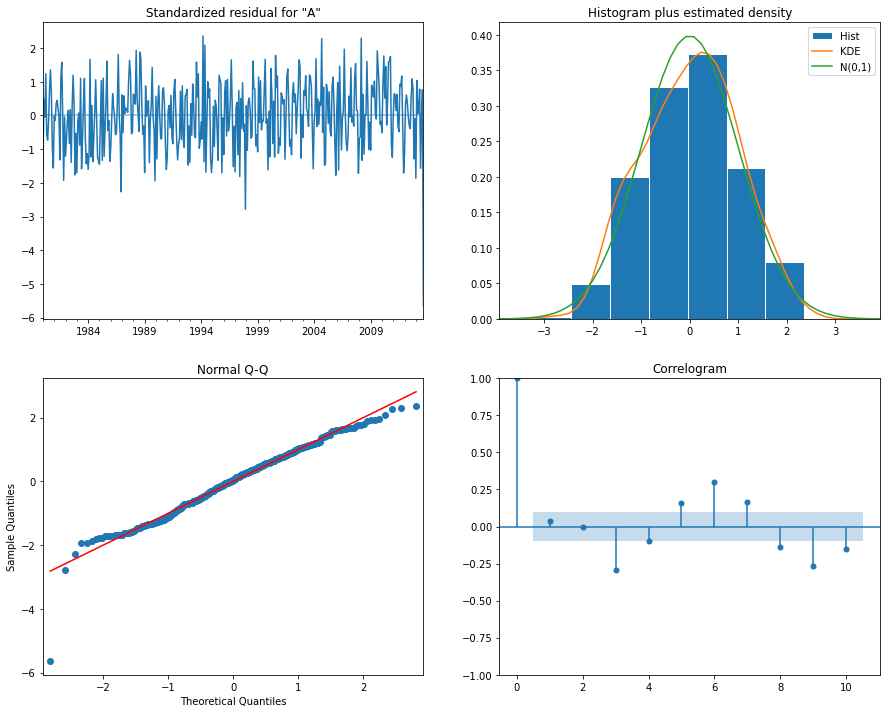

In [175]:
model_fit.plot_diagnostics(figsize=(15, 12))
plt.show()

In [176]:
pred_uc = model_fit.get_forecast(steps=120)
pred_ci = pred_uc.conf_int()

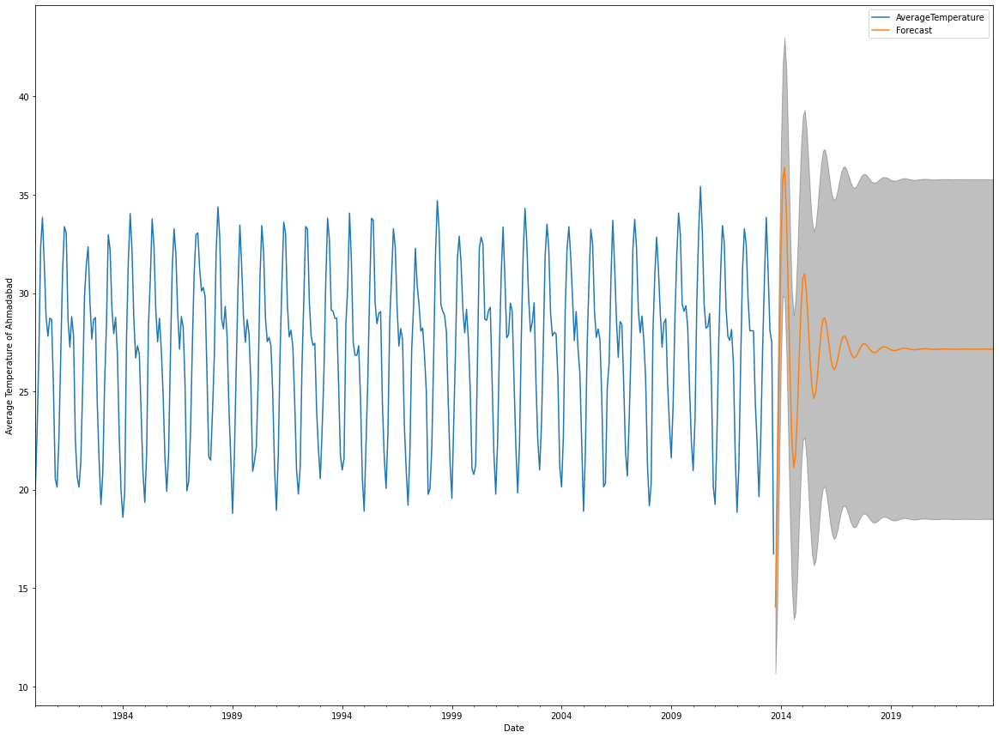

In [177]:
ax = Ahmadabad_new_df.plot(label='observed', figsize=(20, 15))
pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Average Temperature of Ahmadabad')

plt.legend()
plt.show()

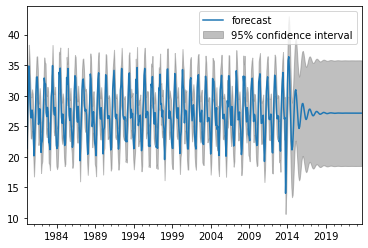

In [178]:
from statsmodels.graphics.tsaplots import plot_predict
plot_predict(model_fit,1,524,)
plt.show()

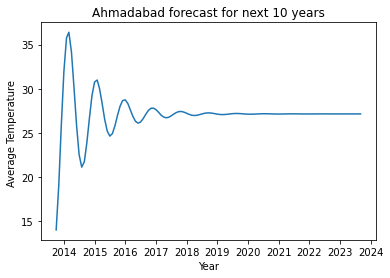

In [179]:
x5= model_fit.forecast(steps=120)
plt.xlabel('Year')
plt.ylabel('Average Temperature ')
plt.title('Ahmadabad forecast for next 10 years')
plt.plot(x5)

# **FINAL PREDICTIONS OF ALL FIVE MAJOR CITIES OF INDIA**

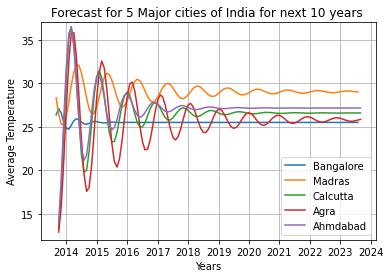

In [200]:
plt.plot(x1,label="Bangalore")
plt.plot(x2,label="Madras")
plt.plot(x3,label="Calcutta")
plt.plot(x4,label="Agra")
plt.plot(x5,label="Ahmdabad")
plt.xlabel('Years')
plt.ylabel('Average Temperature')
plt.title('Forecast for 5 Major cities of India for next 10 years ')
plt.ylim(12,37)
plt.legend()
plt.grid('Square')
plt.show()